In [1]:
import emd.sift as sift
import emd.spectra as spectra
import numpy as np
import pingouin as pg
import sails
import scipy.io as sio
import h5py
import time
import timeit
import matplotlib.pyplot as plt
from scipy.stats import zscore
from scipy.signal import convolve2d
from scipy.stats import zscore, binned_statistic
from scipy.ndimage import center_of_mass
import matplotlib.pyplot as plt
import os
import glob
import concurrent.futures
from skimage.feature import peak_local_max
from scipy.io import loadmat
import emd


In [35]:
# The get_rem_states function takes in an array of sleep states and the sample rate of the data.
def get_rem_states(states, sample_rate):
    """
    Extract consecutive REM (Rapid Eye Movement) sleep states and their start
    and end times from an array of sleep states.

    Parameters:
    - states (numpy.ndarray): One-dimensional array of sleep states.
    - sample_rate (int): The sample rate of the data.

    Returns:
    numpy.ndarray: An array containing start and end times of consecutive REM
    sleep states. Each row represents a pair of start and end times.

    Note:
    - Sleep states are represented numerically. In this function, REM sleep
      states are identified by the value 5 in the 'states' array.

    Example:
    ```python
    import numpy as np

    # Example usage:
    sleep_states = np.array([1, 2, 5, 5, 5, 3, 2, 5, 5, 4, 1])
    sample_rate = 2500  # Example sample rate in Hz
    rem_states_times = get_rem_states(sleep_states, sample_rate)
    print(rem_states_times)
    ```
    """
    try:
        # Ensure the sleep states array is one-dimensional.
        states = np.squeeze(states)
        # Find the indices where the sleep state is equal to 5, indicating REM sleep.
        rem_state_indices = np.where(states == 5)[0]
        
        # Check if there are no REM states. If so, return an empty array.
        if len(rem_state_indices) == 0:
            return np.array([])
        # Calculate the changes between consecutive REM state indices.
        rem_state_changes = np.diff(rem_state_indices)
        # Find the indices where consecutive REM states are not adjacent.
        split_indices = np.where(rem_state_changes != 1)[0] + 1
        # Add indices to split consecutive REM states, including the start and end indices.
        split_indices = np.concatenate(([0], split_indices, [len(rem_state_indices)]))
        # Create an empty array to store start and end times of consecutive REM states.
        consecutive_rem_states = np.empty((len(split_indices) - 1, 2))
        # Iterate through the split indices to extract start and end times.
        for i, (start, end) in enumerate(zip(split_indices, split_indices[1:])):
            start = rem_state_indices[start] * int(sample_rate)
            end = rem_state_indices[end - 1] * int(sample_rate)
            consecutive_rem_states[i] = np.array([start, end])
        # Convert the array to a numpy array.
        ##consecutive_rem_states = np.array(consecutive_rem_states)
        # Create a mask to filter out consecutive REM states with negative duration.
        null_states_mask = np.squeeze(np.diff(consecutive_rem_states) > 0)
        consecutive_rem_states = consecutive_rem_states[null_states_mask]
        # Return the array containing start and end times of consecutive REM states.
        return consecutive_rem_states
    # Handle the case where an IndexError occurs, typically due to an empty array.
    except IndexError as e:
        print(f"An IndexError occurred in get_rem_states: {e}")
        return np.array([])  # or any default value you want


# This function computes the Morlet wavelet transform of a given signal.
# It uses the SAILS library to perform the wavelet transform.
def morlet_wt(x, sample_rate, frequencies=np.arange(1, 200, 1), n=5, mode='complex'):
    """
    Compute the Morlet wavelet transform of a given signal using the SAILS library.

    Parameters:
    - x (numpy.ndarray): The input signal.
    - sample_rate (int): The rate at which the signal is sampled.
    - frequencies (numpy.ndarray, optional): The array of frequencies at which to compute the transform
      (default is from 1 to 200 Hz).
    - n (int, optional): The number of cycles in the Morlet wavelet (default is 5).
    - mode (str, optional): The mode of the return, whether 'complex', 'power', or 'amplitude'
      (default is 'complex').
      
    Returns:
    - numpy.ndarray: The computed Morlet wavelet transform of the input signal.

    Note:
    - This function relies on the SAILS library to perform the wavelet transform.

    Example:
    ```python
    import numpy as np

    # Example usage:
    signal = np.sin(2 * np.pi * 10 * np.arange(0, 1, 1/sample_rate))
    wt_result = morlet_wt(signal, sample_rate)
    print(wt_result)
    ```
    """
    wavelet_transform = sails.wavelet.morlet(x, freqs=frequencies, sample_rate=sample_rate, ncycles=n,
                                             ret_mode=mode, normalise=None)
    # Return the computed wavelet transform.
    return wavelet_transform


# The tg_split function categorizes frequency values into three groups: sub-theta, theta, and supra-theta.
def tg_split(mask_freq, theta_range=(5, 12)):
    """
    Categorize frequency values into three groups: sub-theta, theta, and supra-theta.

    Parameters:
    - mask_freq (numpy.ndarray): An array of frequency values that you want to categorize.
    - theta_range (tuple, optional): A range of frequencies considered as the theta band
      (default is (5, 12) Hz).

    Returns:
    - tuple: A tuple containing three boolean masks representing sub-theta, theta, and supra-theta categories.

    Example:
    ```python
    import numpy as np

    # Example usage:
    freq_values = np.array([3, 8, 10, 15, 20])
    sub_mask, theta_mask, supra_mask = tg_split(freq_values)
    print("Sub-theta frequencies:", freq_values[sub_mask])
    print("Theta frequencies:", freq_values[theta_mask])
    print("Supra-theta frequencies:", freq_values[supra_mask])
    ```
    """
    # Get the lower and upper bounds of the theta range.
    lower = np.min(theta_range)
    upper = np.max(theta_range)
    # Create a boolean mask for frequencies within the theta range.
    mask_index = np.logical_and(mask_freq >= lower, mask_freq < upper)
    # Create boolean masks for frequencies below and above the theta range.
    sub_mask_index = mask_freq < lower
    supra_mask_index = mask_freq > upper
    # Assign the boolean masks to variables for each category.
    sub = sub_mask_index
    theta = mask_index
    supra = supra_mask_index
    # Return the boolean masks for sub-theta, theta, and supra-theta categories.
    return sub, theta, supra

# This function finds the indices where a signal crosses zero.
# x: The input signal.
def zero_cross(x):
    """
    Find the indices where a signal crosses zero.

    Parameters:
    - x (numpy.ndarray): The input signal.

    Returns:
    - numpy.ndarray: An array containing the indices where the input signal crosses zero.

    Example:
    ```python
    import numpy as np

    # Example usage:
    signal = np.array([1, -2, 3, -1, 0, 2, -4, 5])
    zero_cross_indices = zero_cross(signal)
    print("Zero-crossing indices:", zero_cross_indices)
    ```
    """
    # Identify where the signal goes from positive to non-positive (decay).
    decay = np.logical_and((x > 0)[1:], ~(x > 0)[:-1]).nonzero()[0]
    # Identify where the signal goes from non-positive to positive (rise).
    rise = np.logical_and((x <= 0)[1:], ~(x <= 0)[:-1]).nonzero()[0]
    # Combine the indices of rise and decay, then sort them with ascending indices.
    zero_xs = np.sort(np.append(rise, decay))
    # Return the sorted indices where the signal crosses zero.
    return zero_xs

# This function identifies the zero crossings, peaks, and troughs in a signal.
def extrema(x):
    """
    Identify the zero crossings, peaks, and troughs in a signal.

    Parameters:
    - x (numpy.ndarray): The input signal.

    Returns:
    - tuple: A tuple containing three arrays - zero-crossing indices, trough indices, and peak indices.

    Example:
    ```python
    import numpy as np

    # Example usage:
    signal = np.array([1, -2, 3, -1, 0, 2, -4, 5])
    zero_crossings, trough_indices, peak_indices = extrema(signal)
    print("Zero-crossing indices:", zero_crossings)
    print("Trough indices:", trough_indices)
    print("Peak indices:", peak_indices)
    ```
    """
    # Find the indices where the signal crosses zero.
    zero_xs = zero_cross(x)
    # Initialize empty arrays to store peak and trough indices.
    peaks = np.empty((0,)).astype(int)
    troughs = np.empty((0,)).astype(int)
    # Iterate through pairs of consecutive zero crossings.
    for t1, t2 in zip(zero_xs, zero_xs[1:]):
        # Find the index of the maximum absolute value in the current segment.
        extrema0 = np.argmax(np.abs(x[t1:t2])).astype(int) + t1
        # Check if the value at the found index is positive (peak) or non-positive (trough).
        if bool(x[extrema0] > 0):
            peaks = np.append(peaks, extrema0)
        else:
            troughs = np.append(troughs, extrema0)
    # Return the indices of zero crossings, troughs, and peaks.
    return zero_xs, troughs, peaks

(230000, 6)


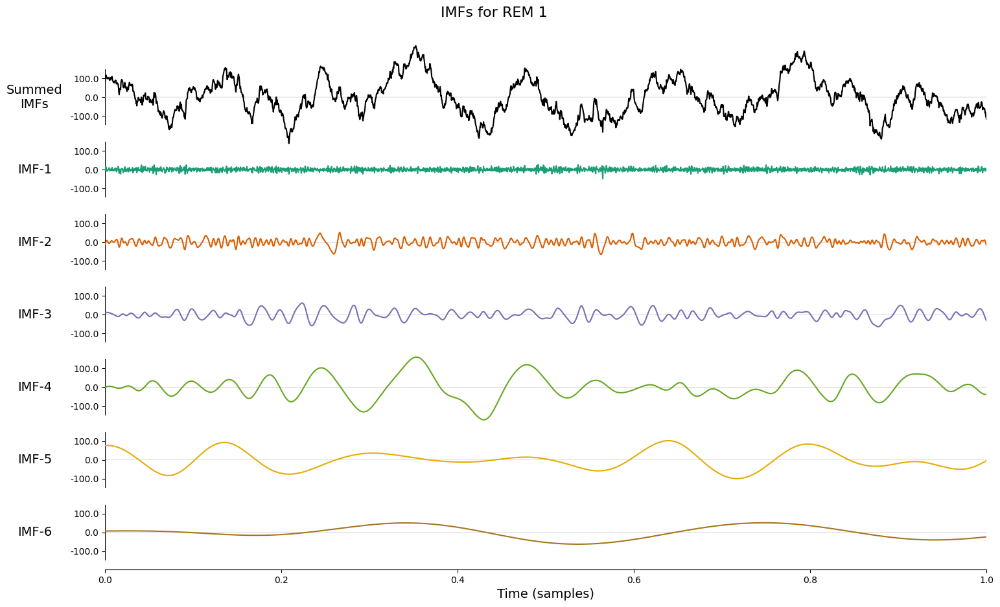

IF shape: (230000, 6)


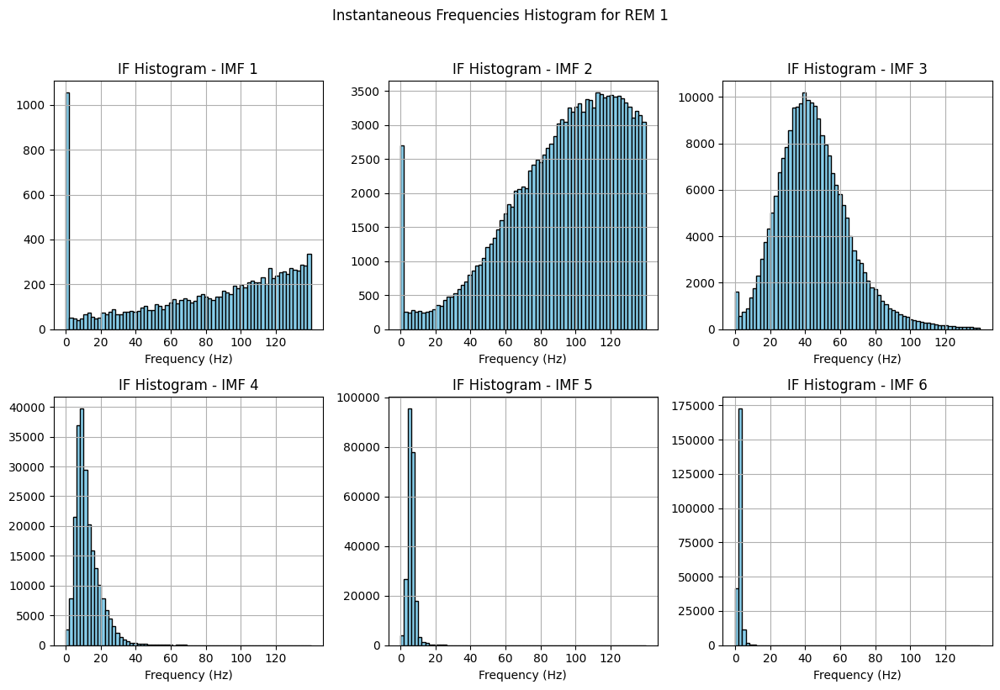

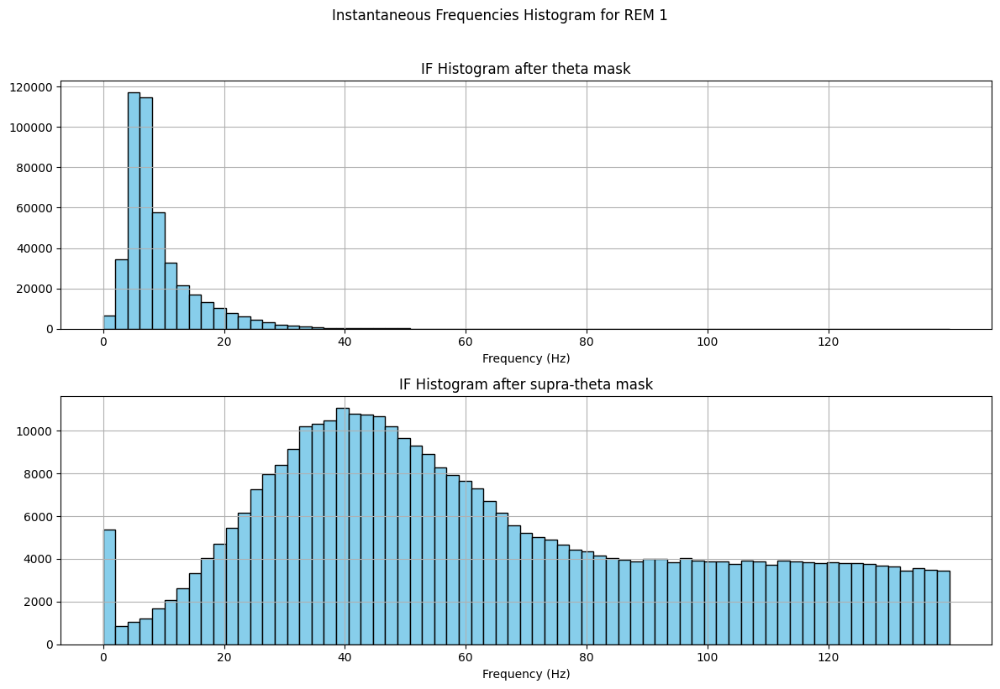

6
230000
[False False False  True  True False]
theta shape: (230000,)


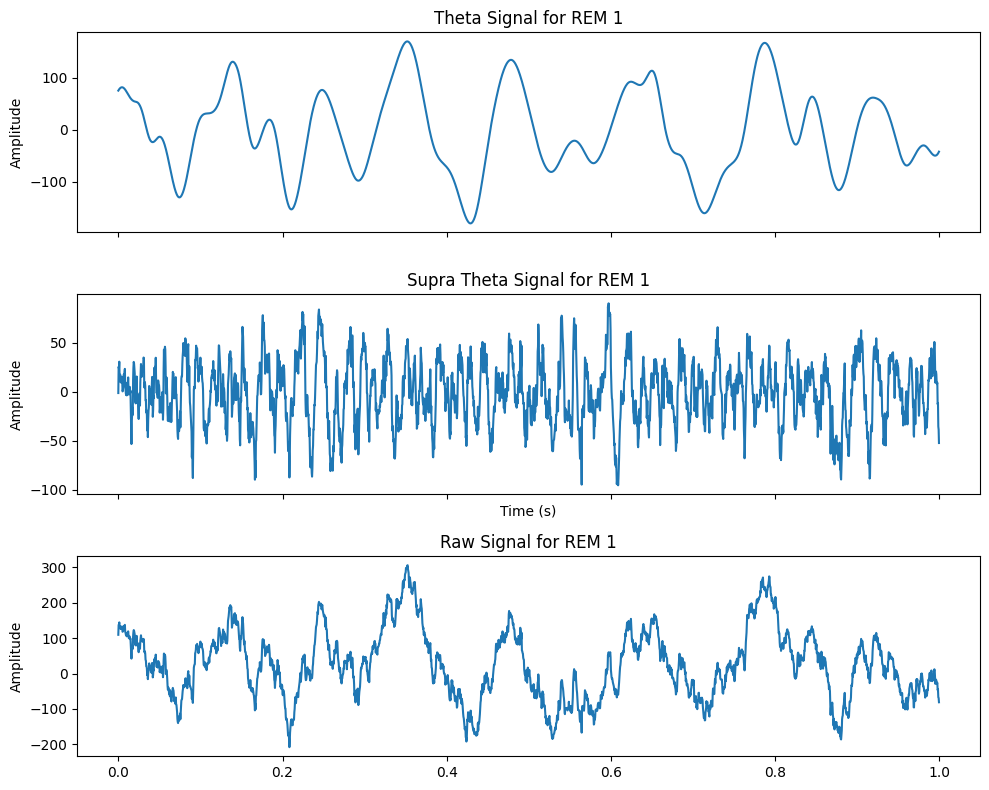

(280000, 6)


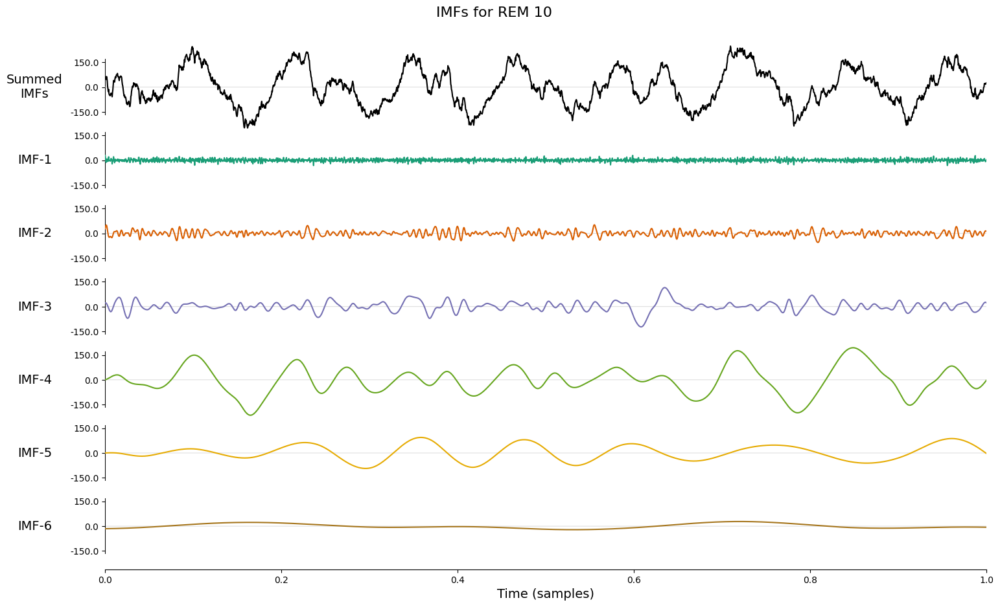

IF shape: (280000, 6)


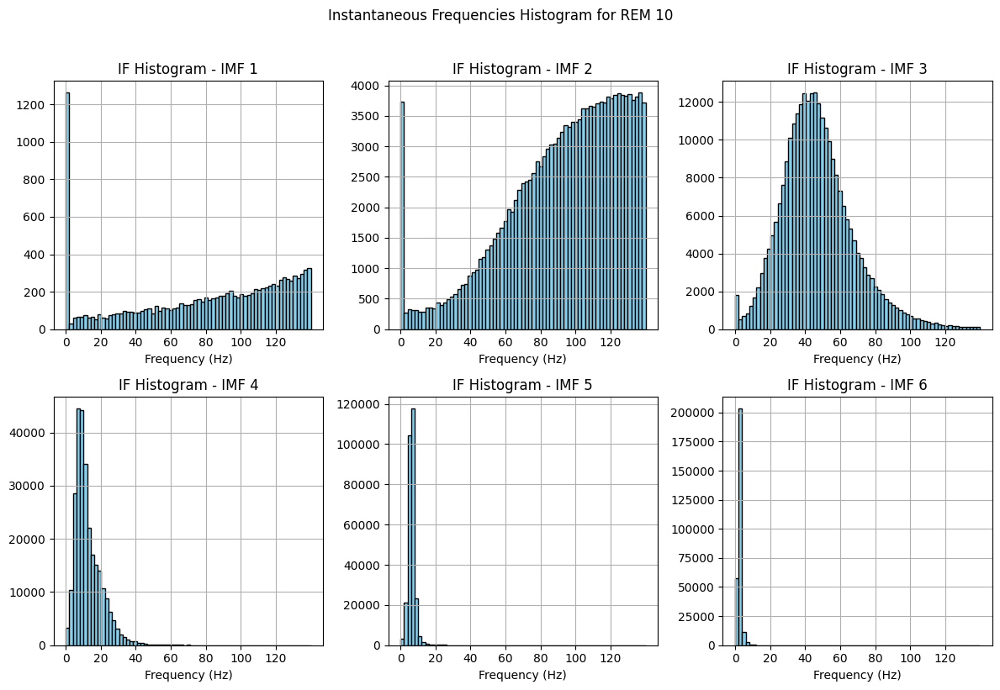

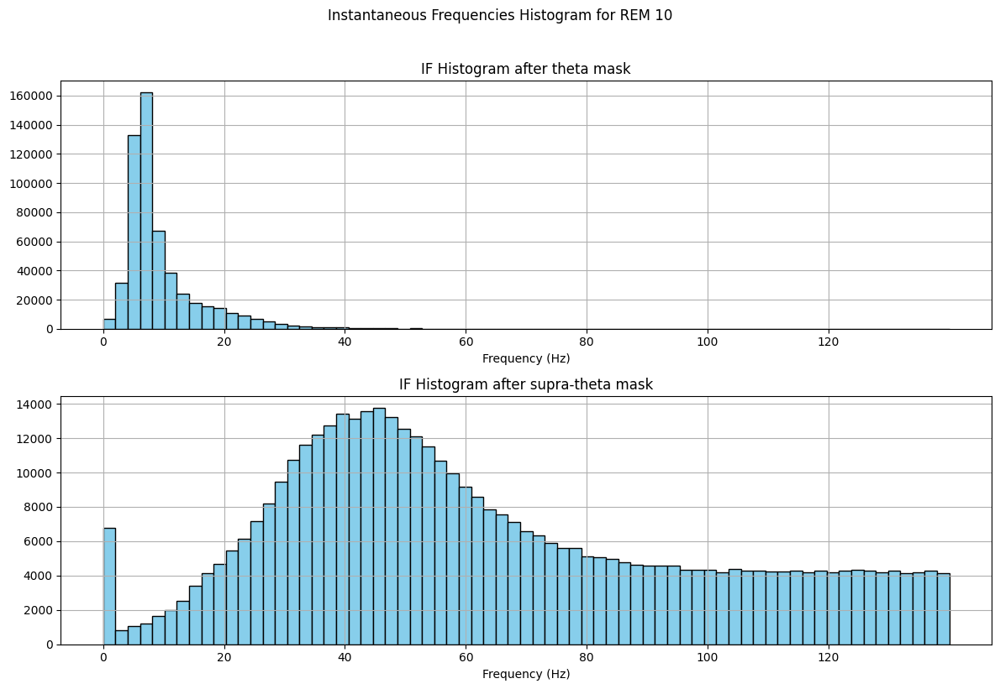

6
280000
[False False False  True  True False]
theta shape: (280000,)


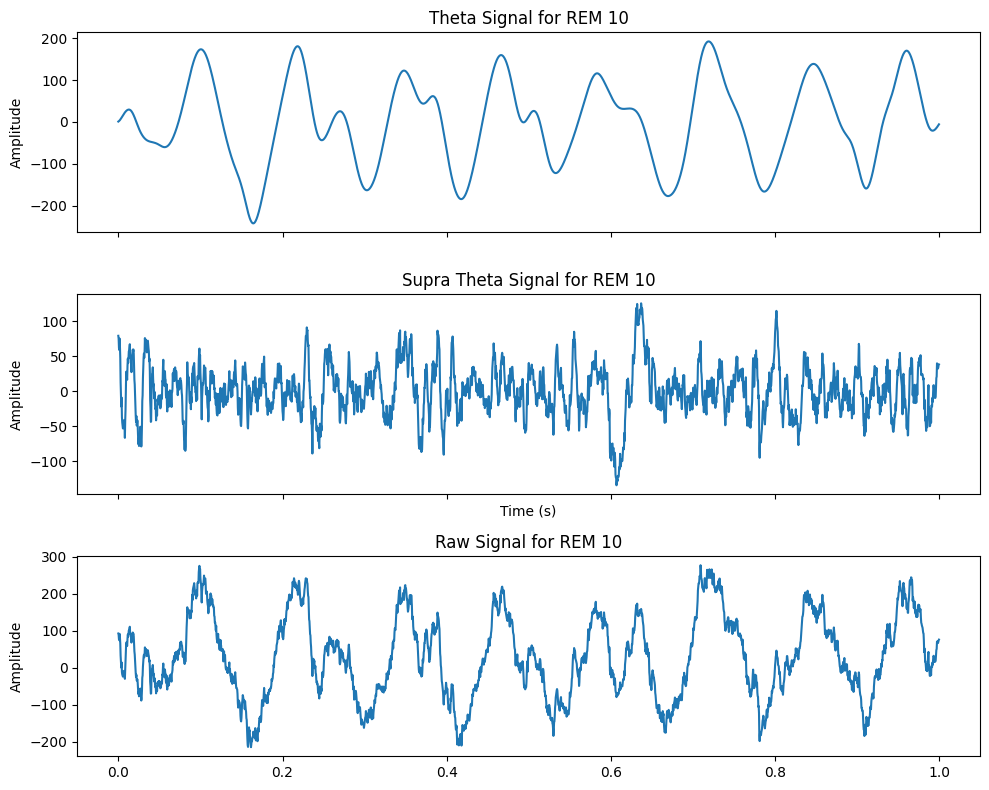

(227500, 6)


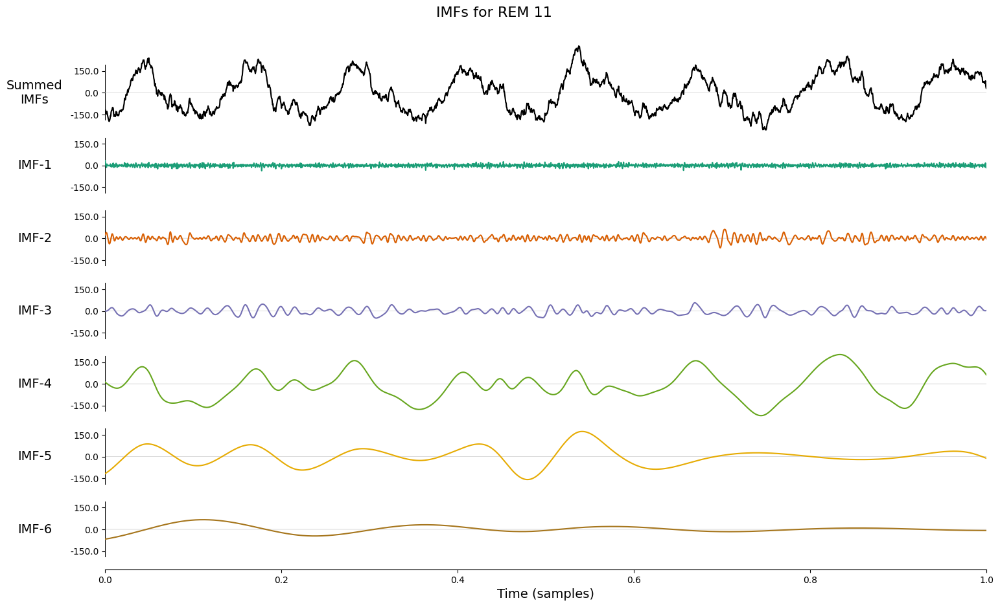

IF shape: (227500, 6)


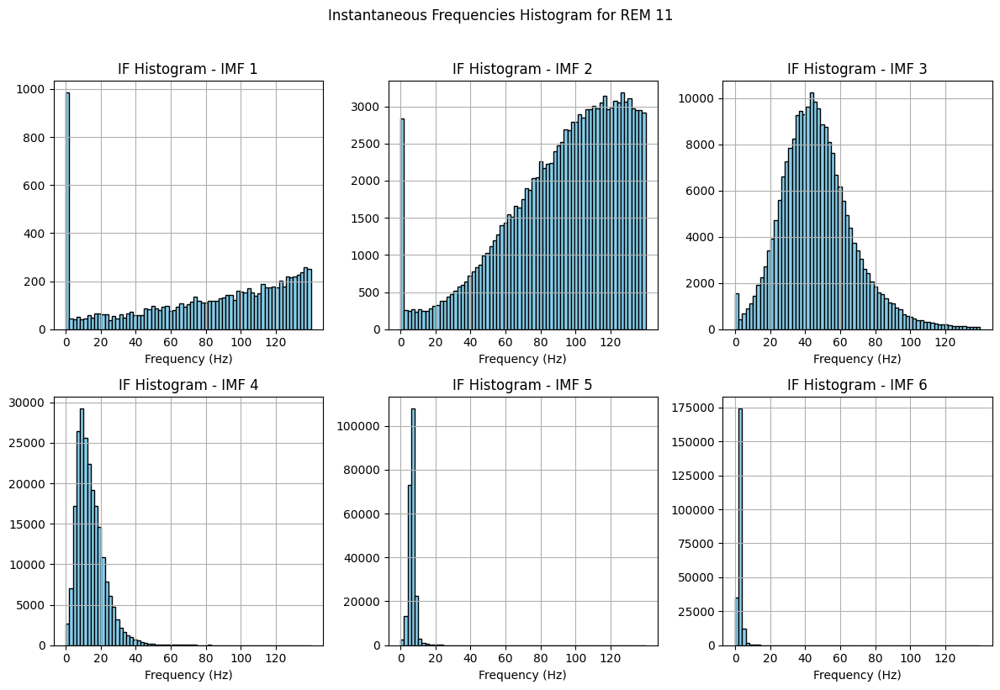

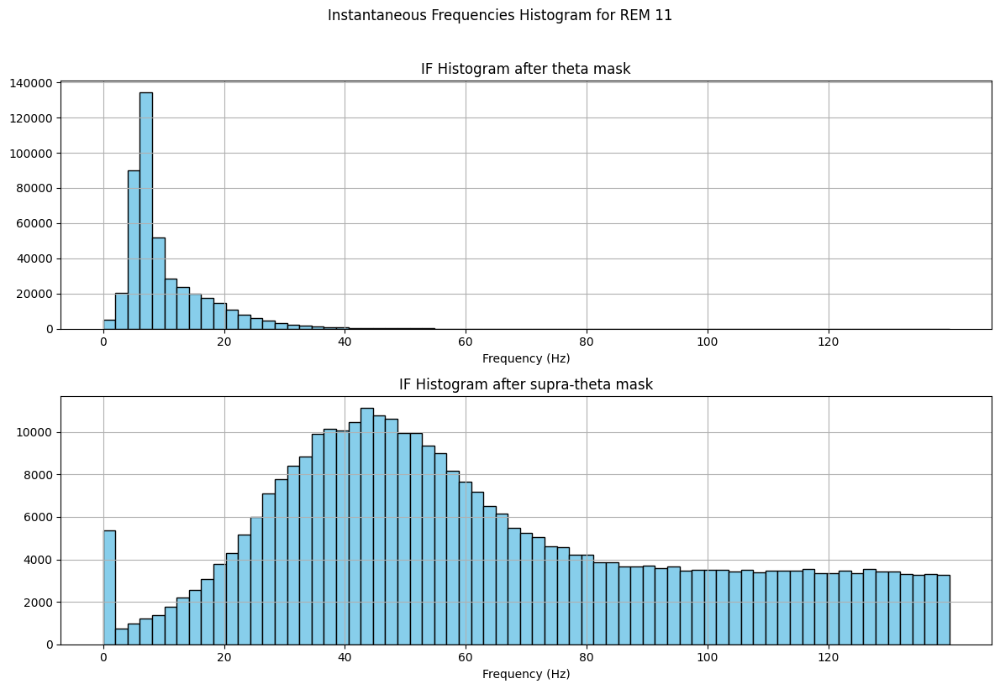

6
227500
[False False False  True  True False]
theta shape: (227500,)


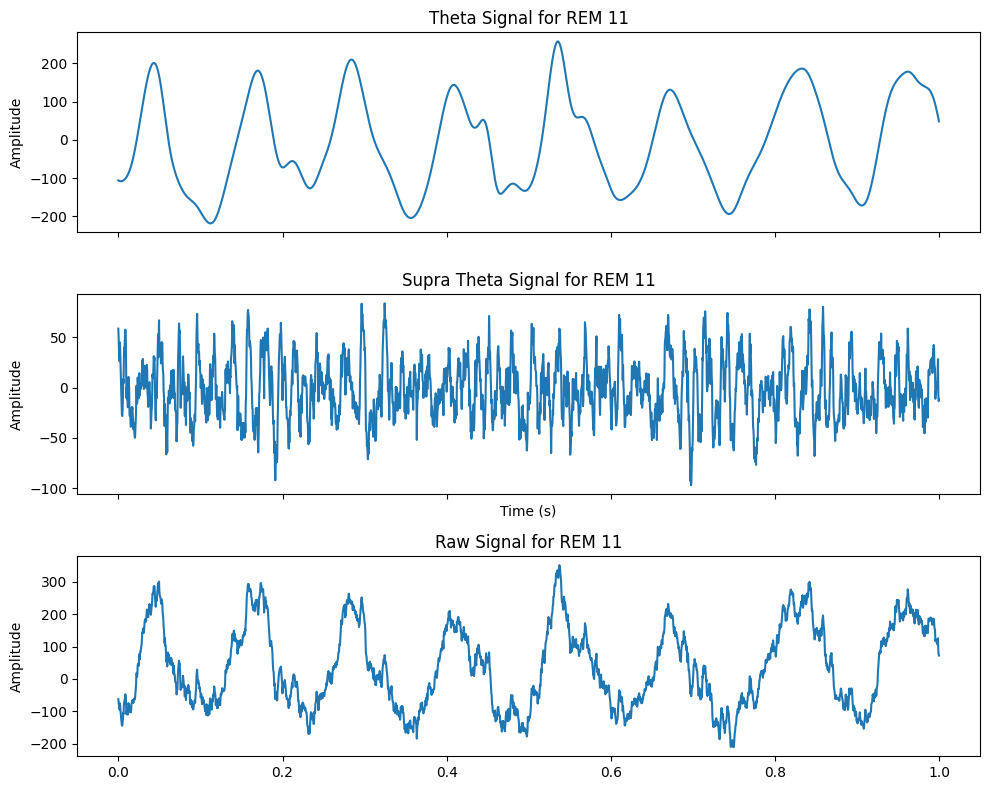

(277500, 6)


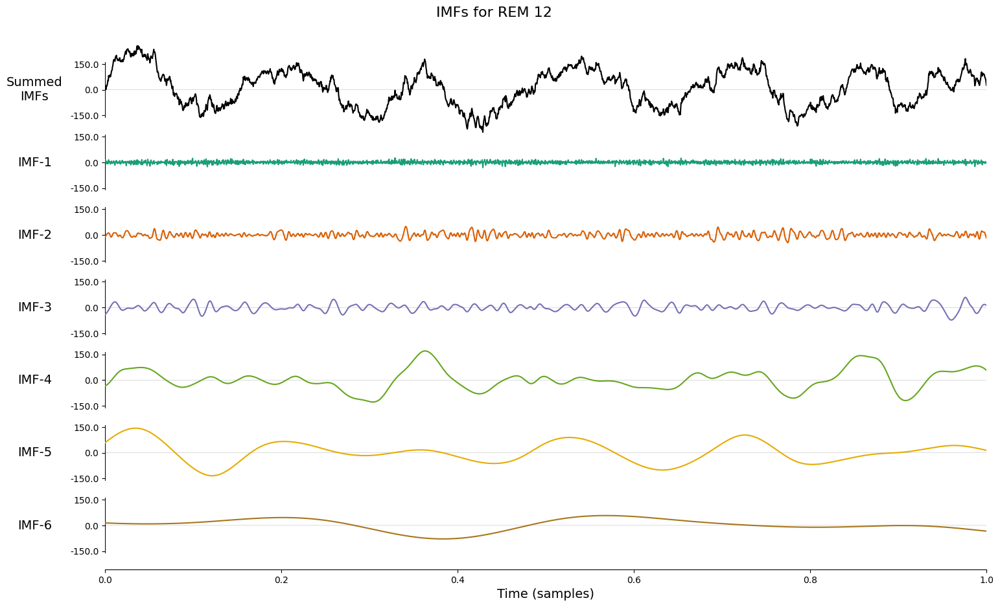

IF shape: (277500, 6)


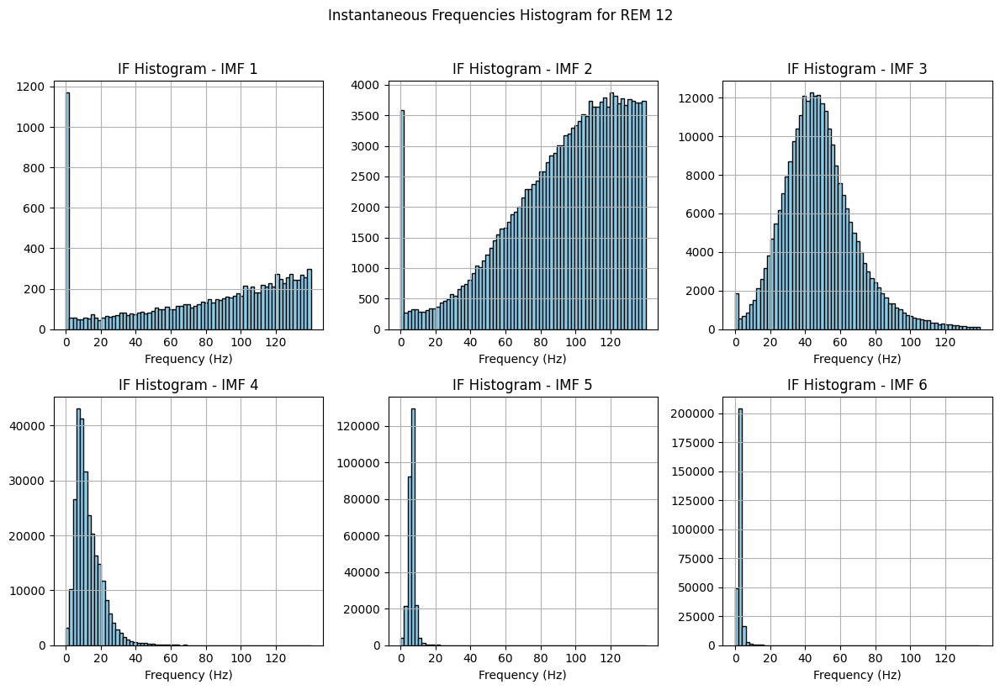

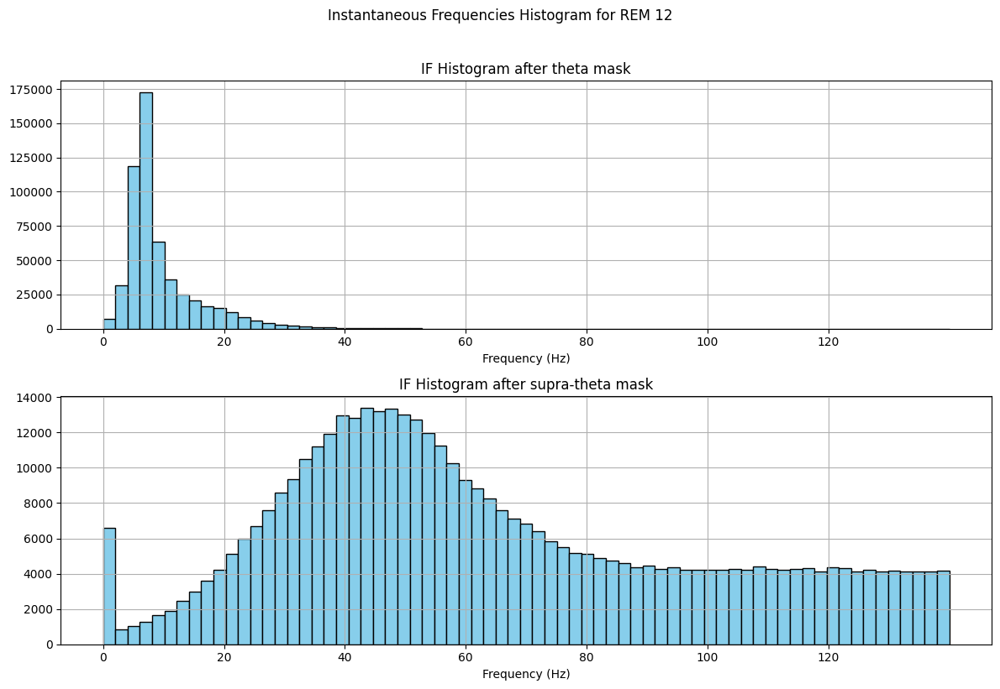

6
277500
[False False False  True  True False]
theta shape: (277500,)


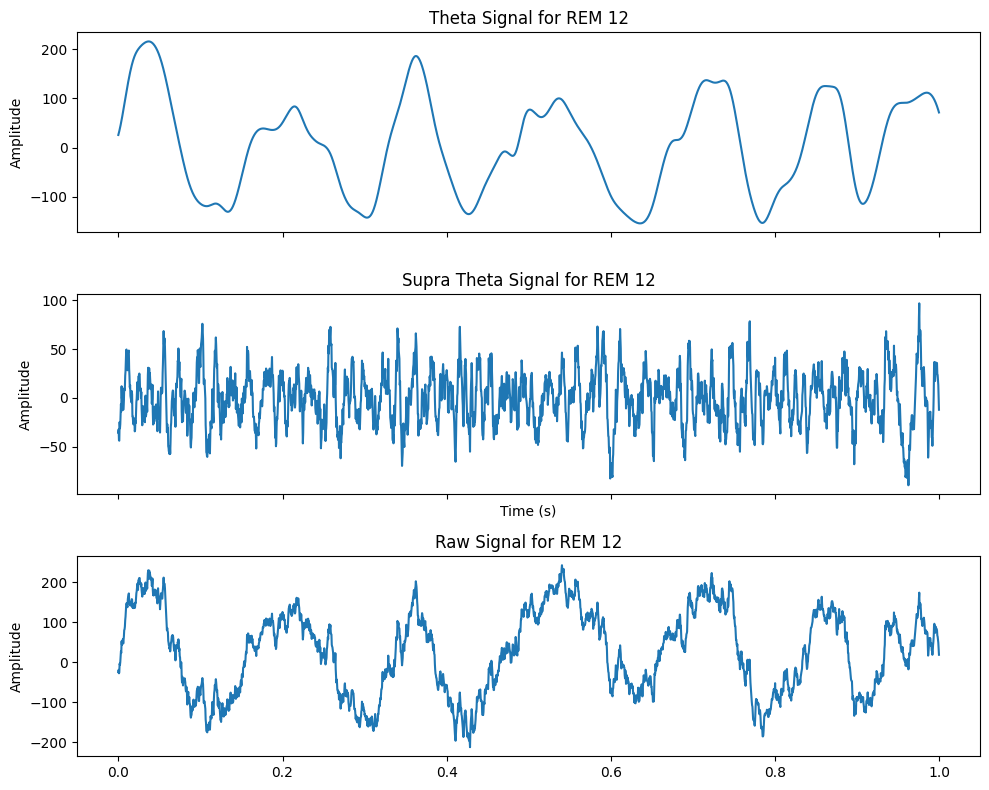

(85000, 6)


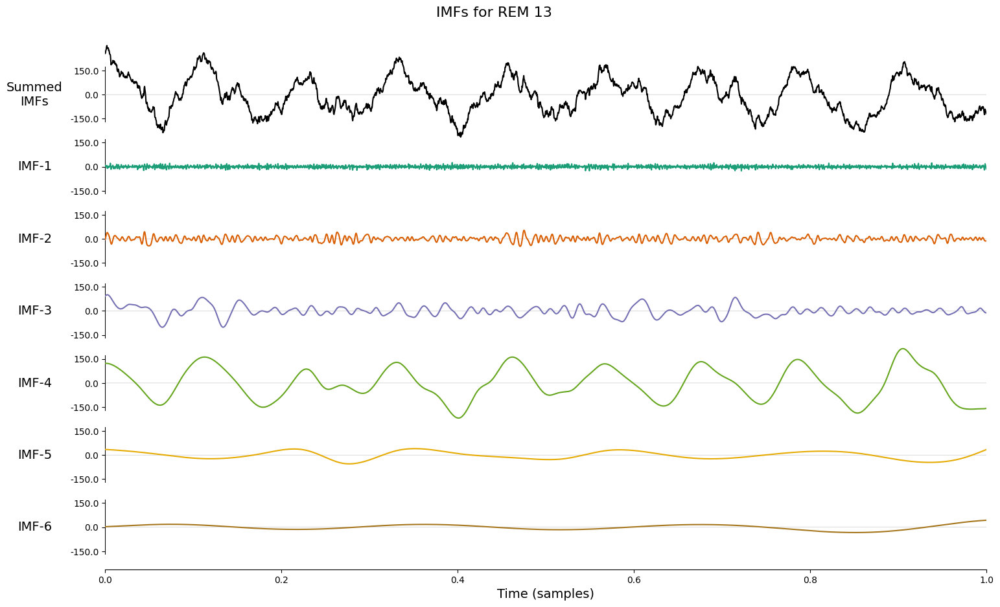

IF shape: (85000, 6)


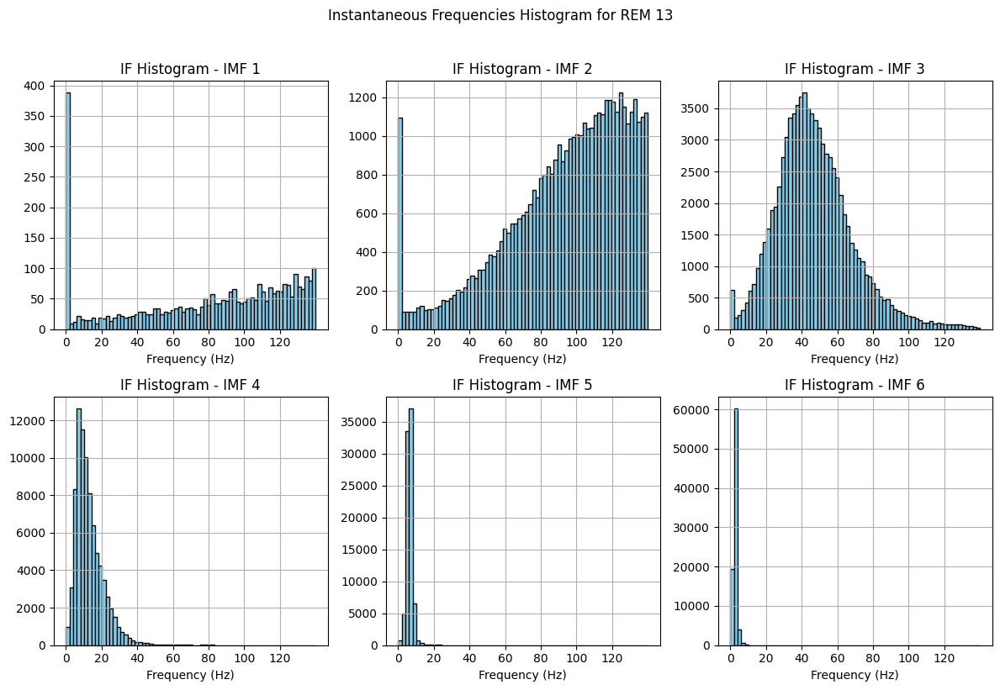

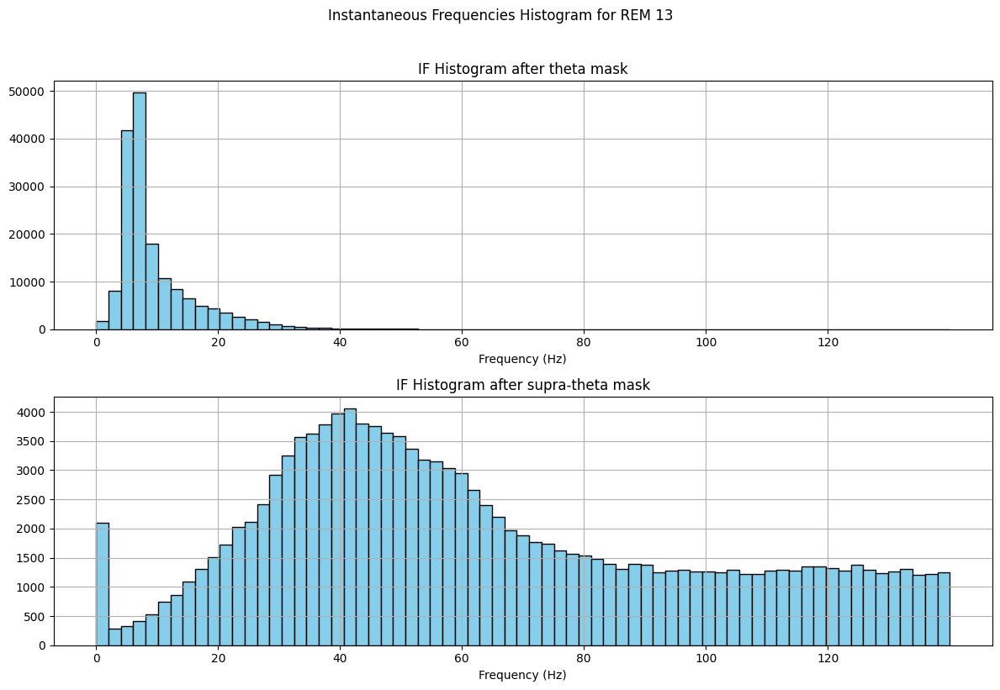

6
85000
[False False False  True  True False]
theta shape: (85000,)


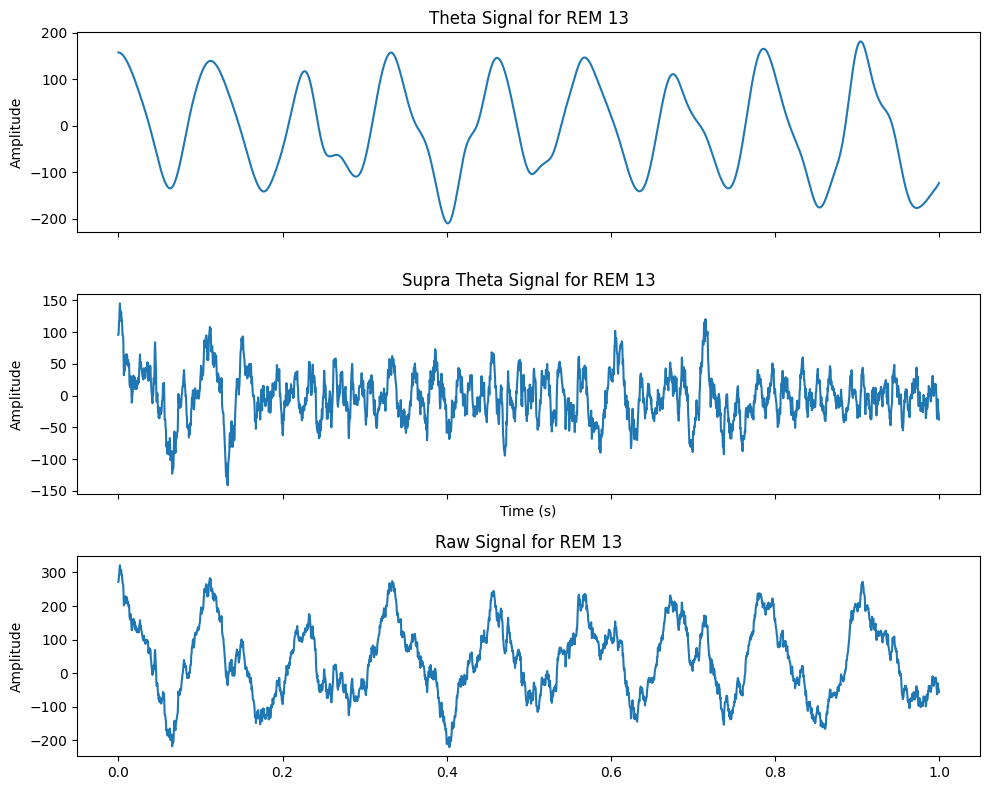

(50000, 6)


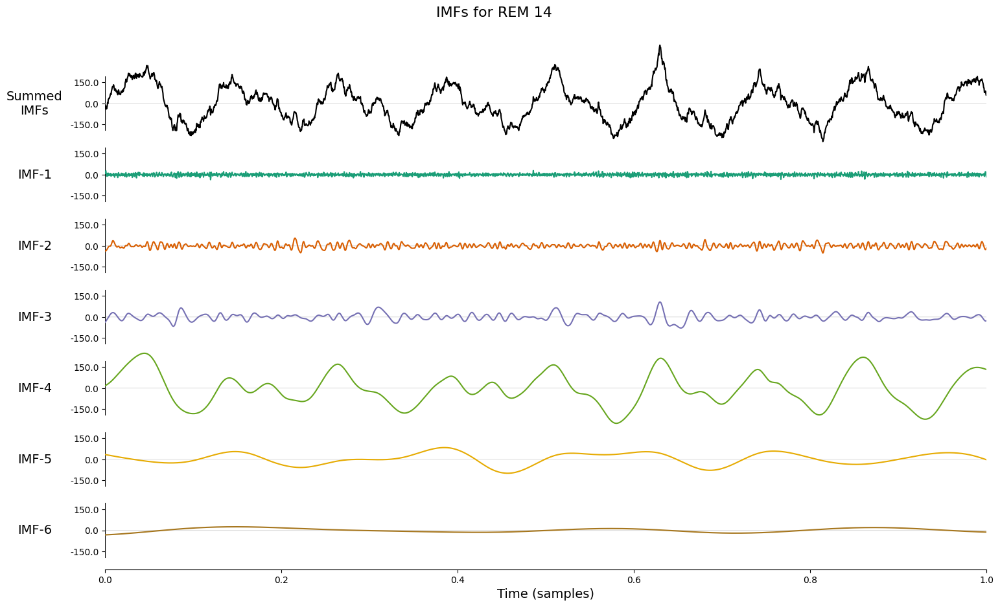

IF shape: (50000, 6)


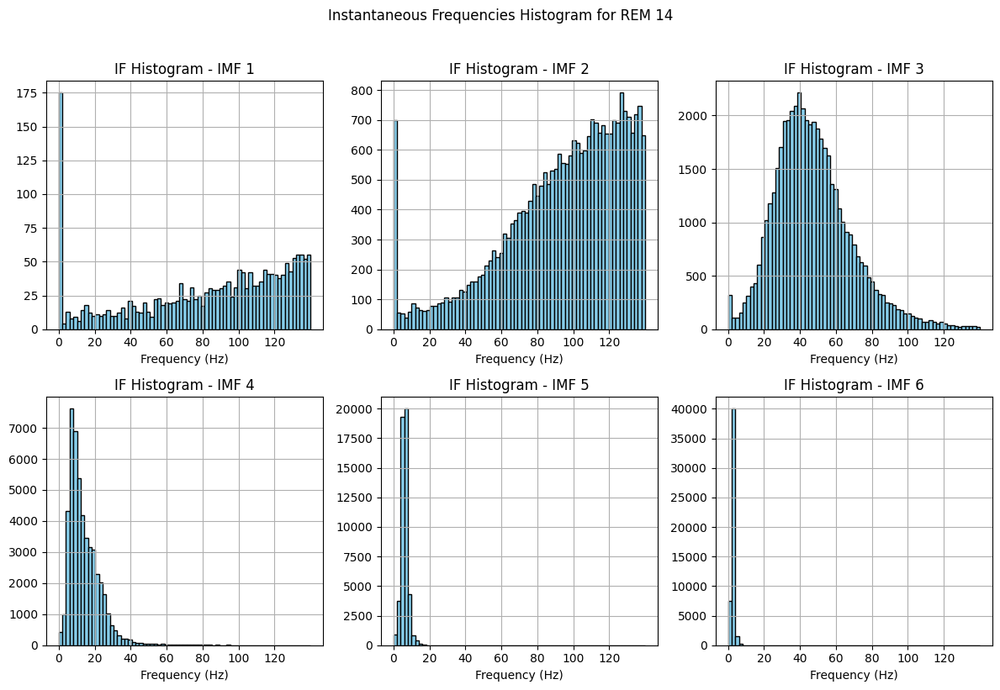

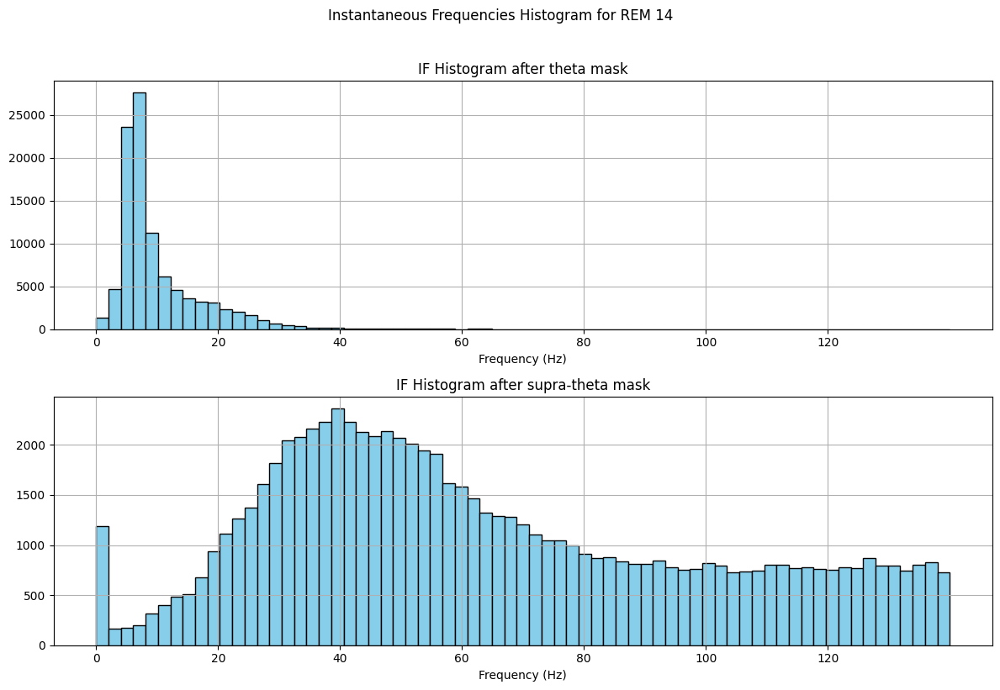

6
50000
[False False False  True  True False]
theta shape: (50000,)


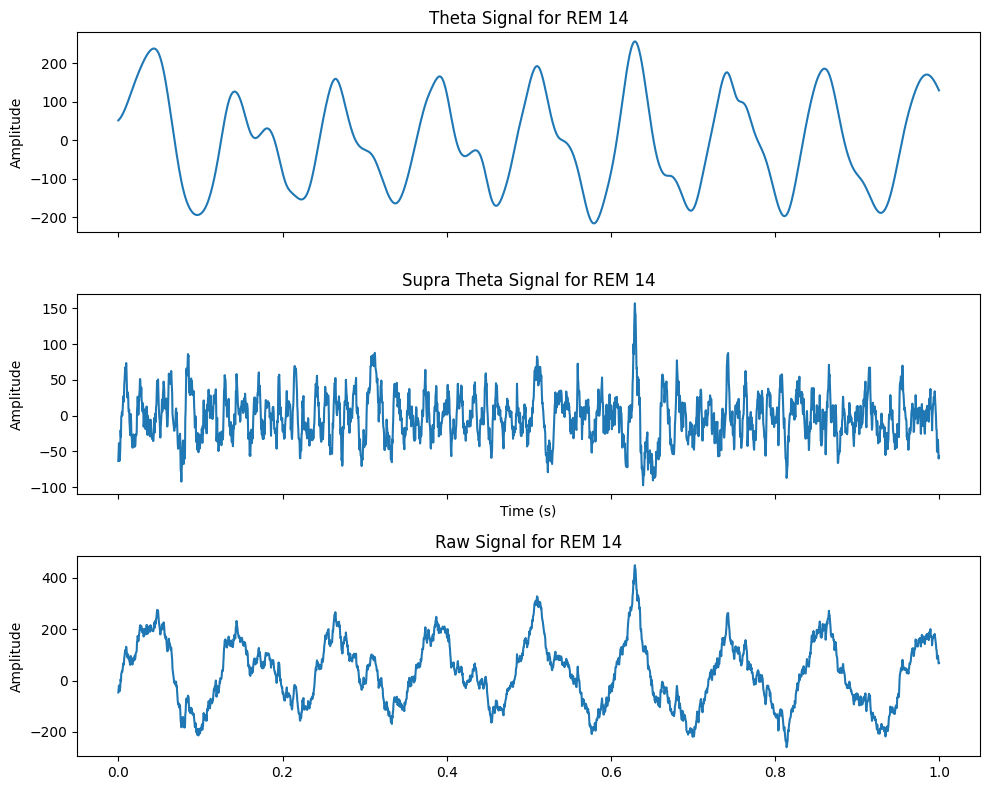

(255000, 6)


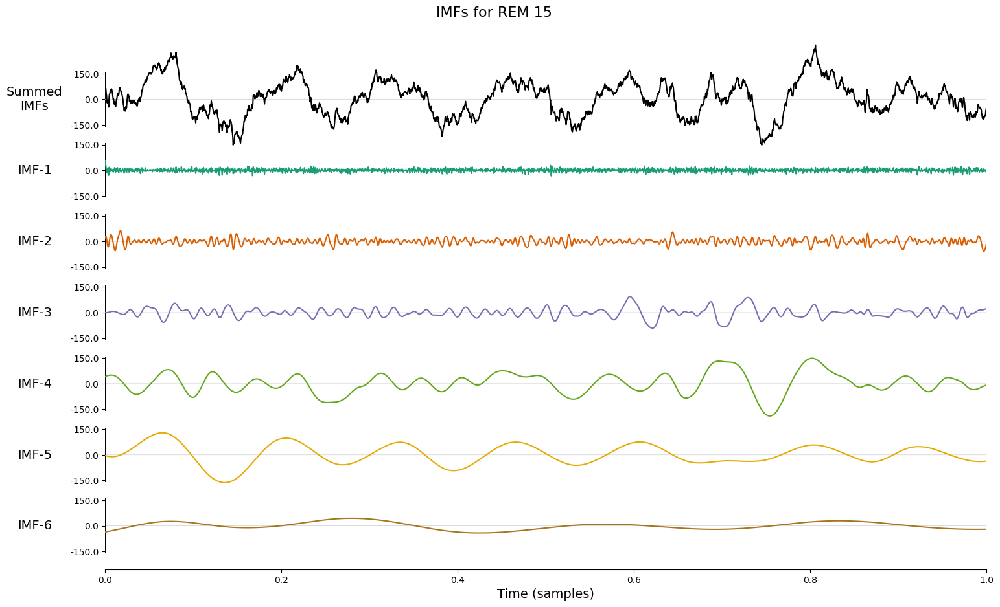

IF shape: (255000, 6)


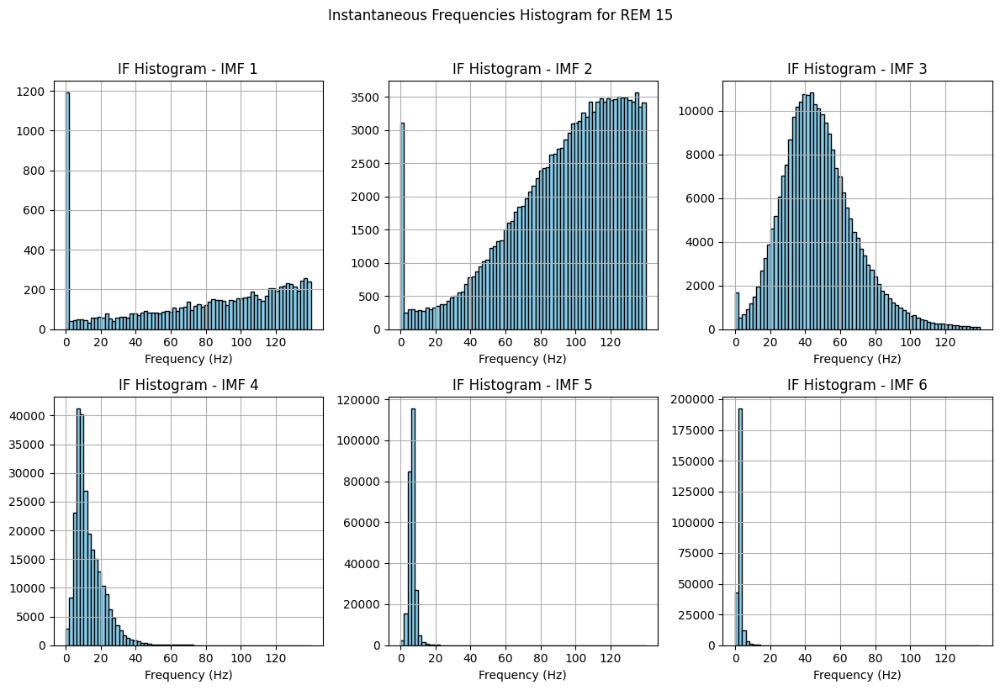

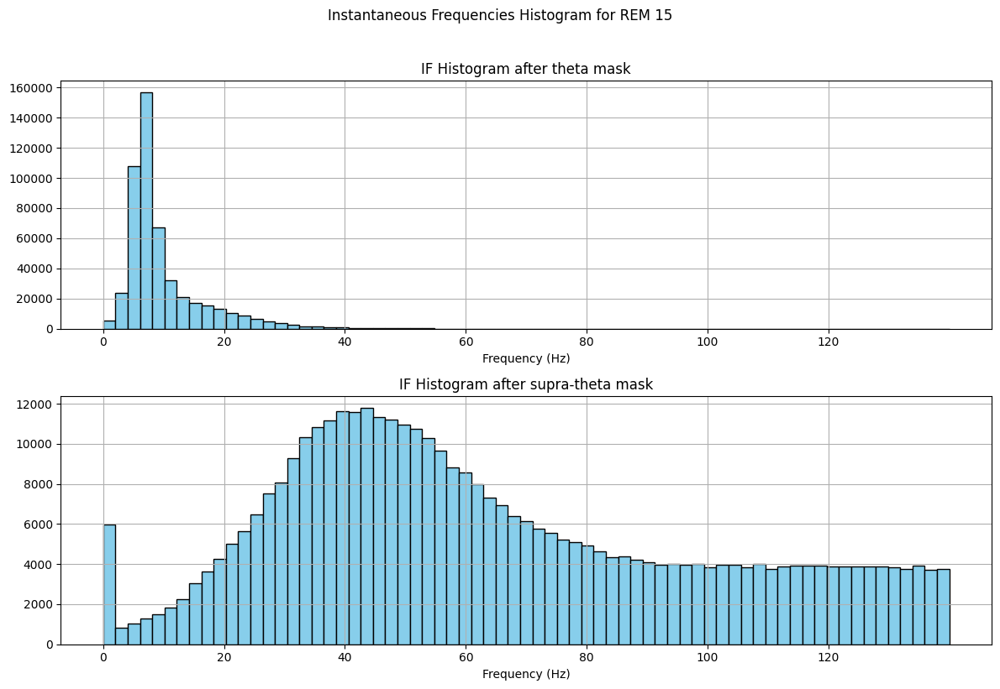

6
255000
[False False False  True  True False]
theta shape: (255000,)


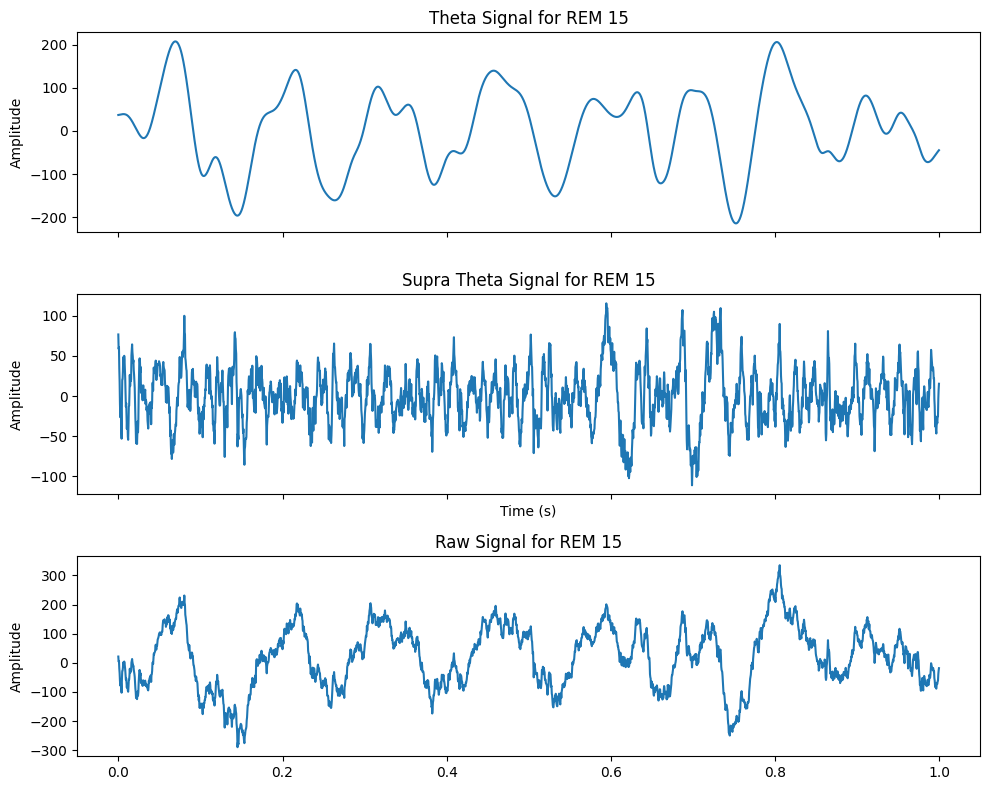

(140000, 6)


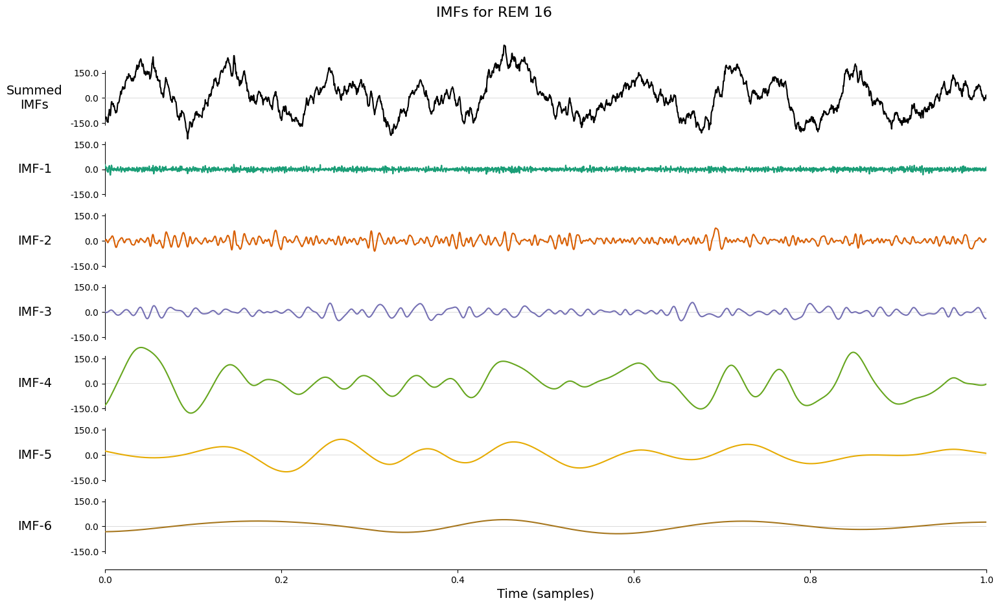

IF shape: (140000, 6)


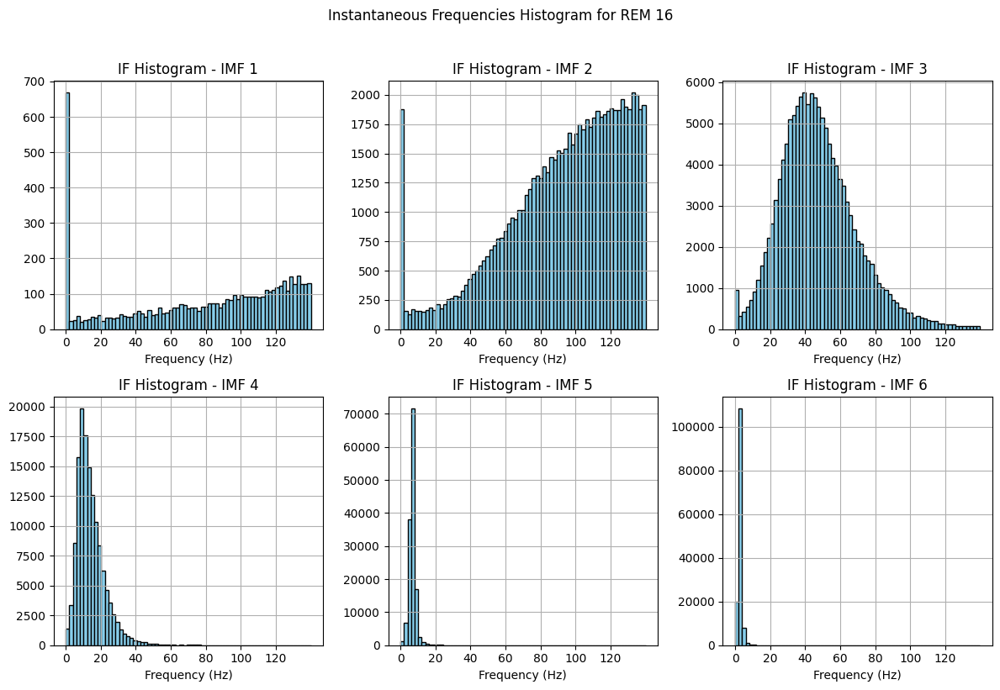

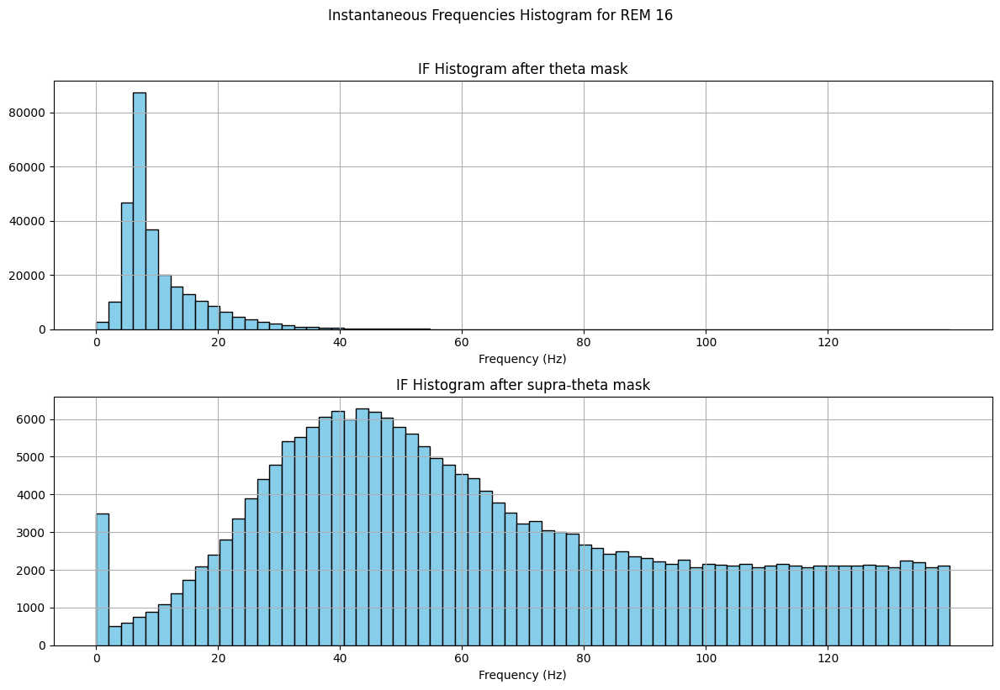

6
140000
[False False False  True  True False]
theta shape: (140000,)


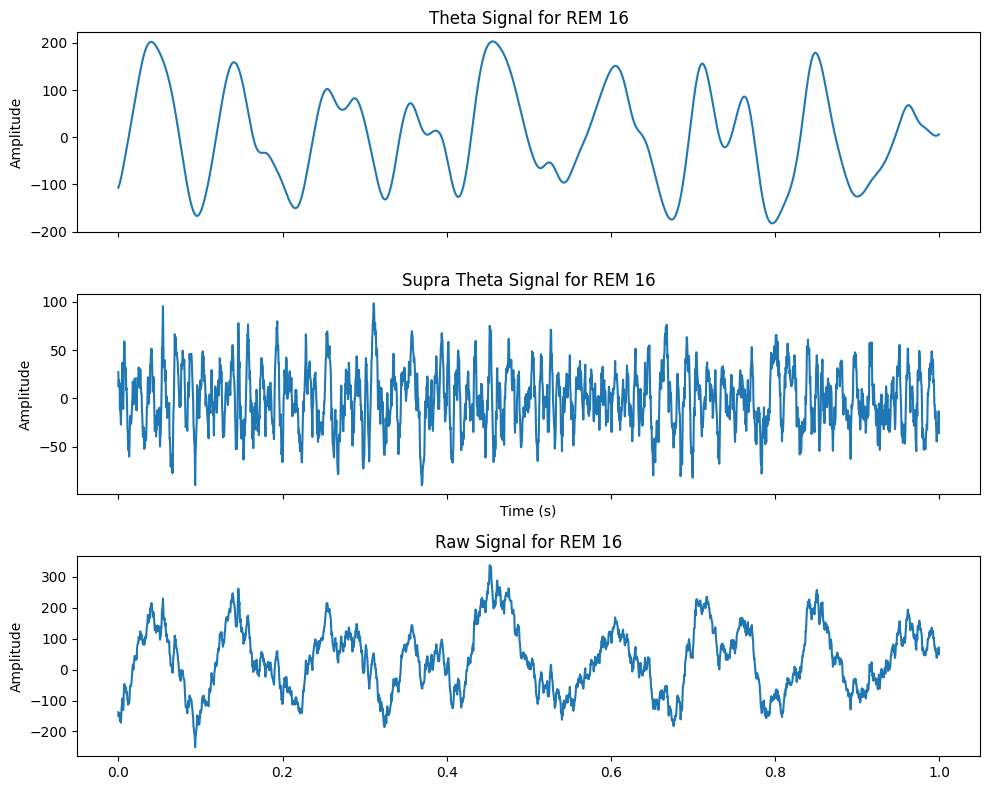

(367500, 6)


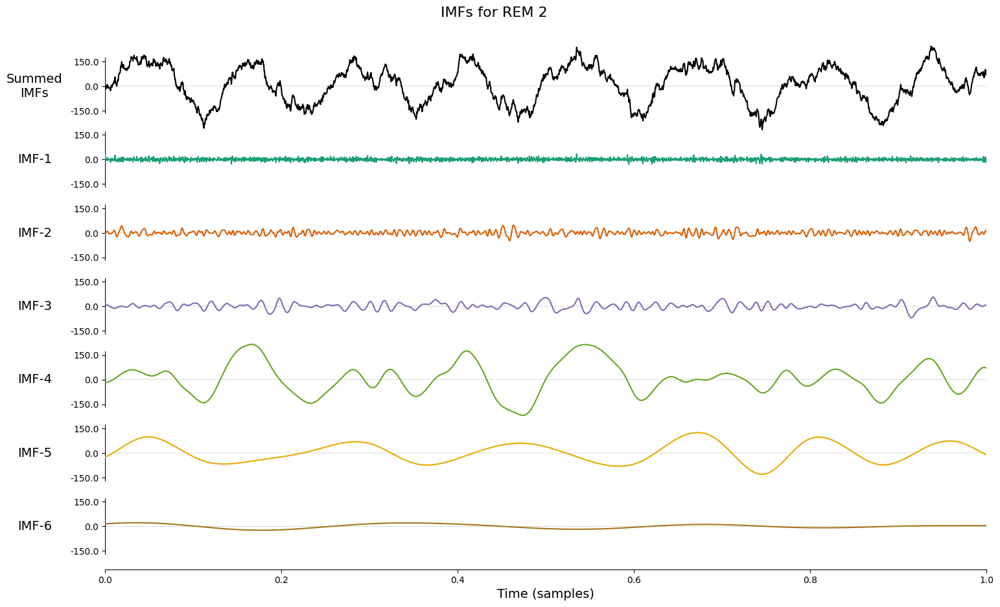

IF shape: (367500, 6)


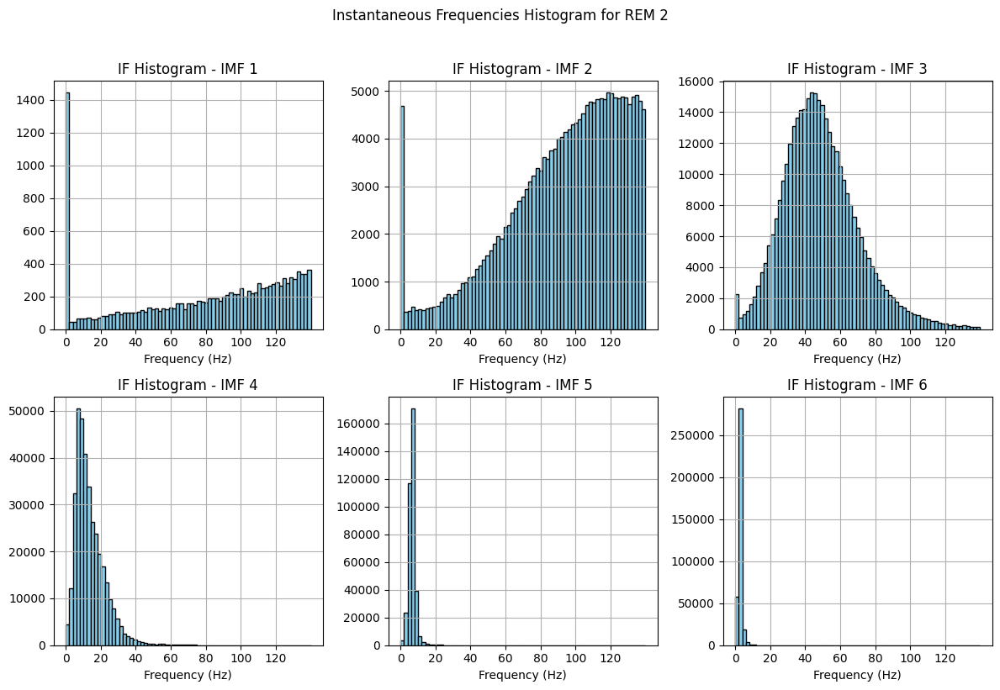

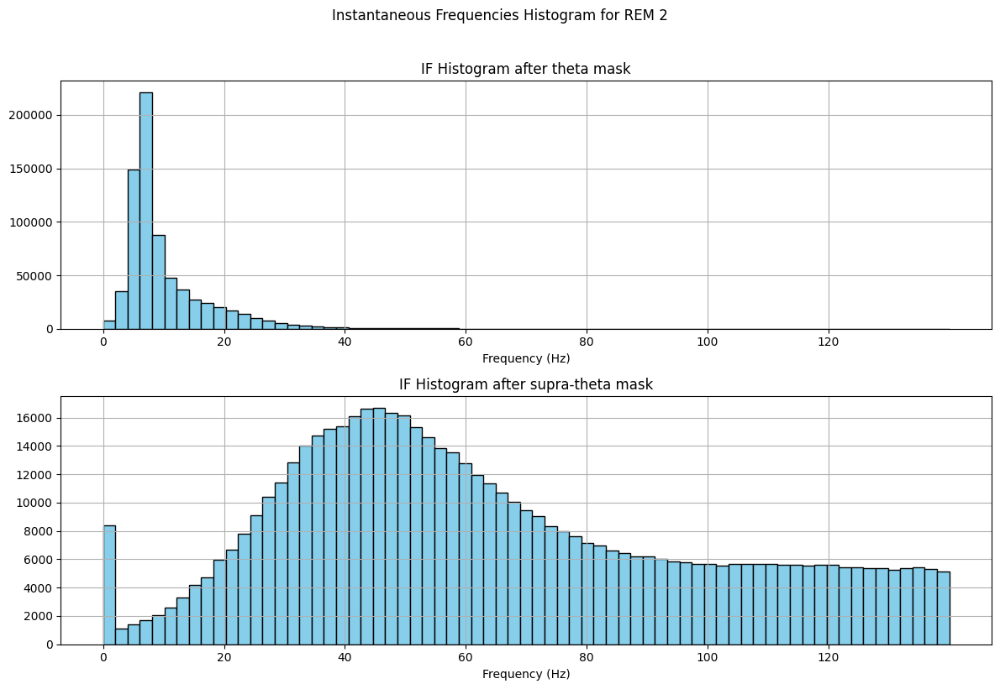

6
367500
[False False False  True  True False]
theta shape: (367500,)


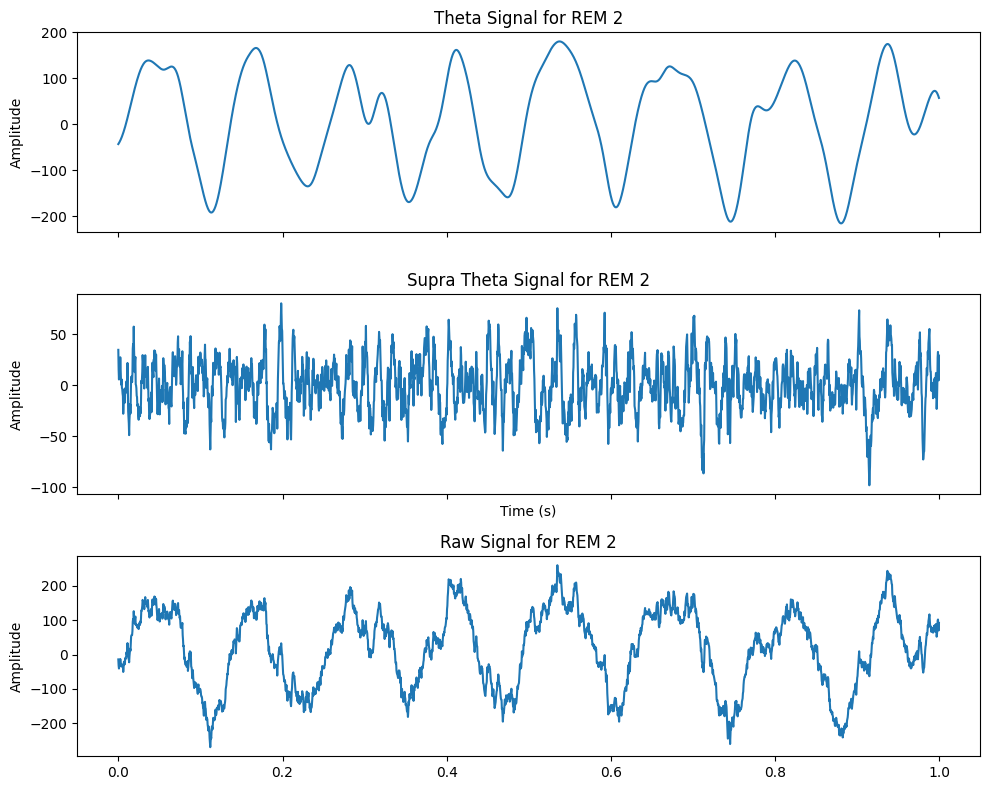

(252500, 6)


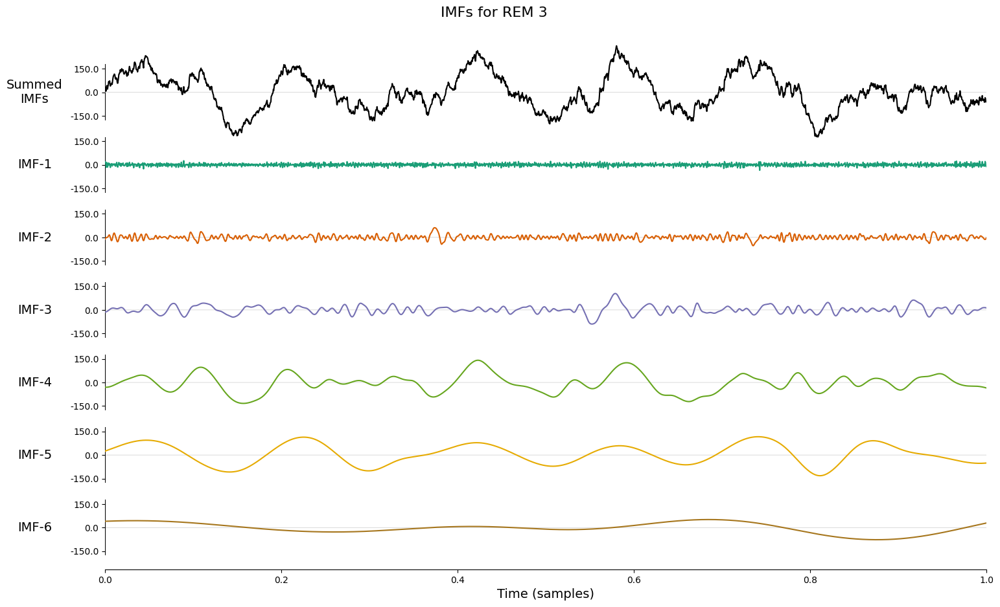

IF shape: (252500, 6)


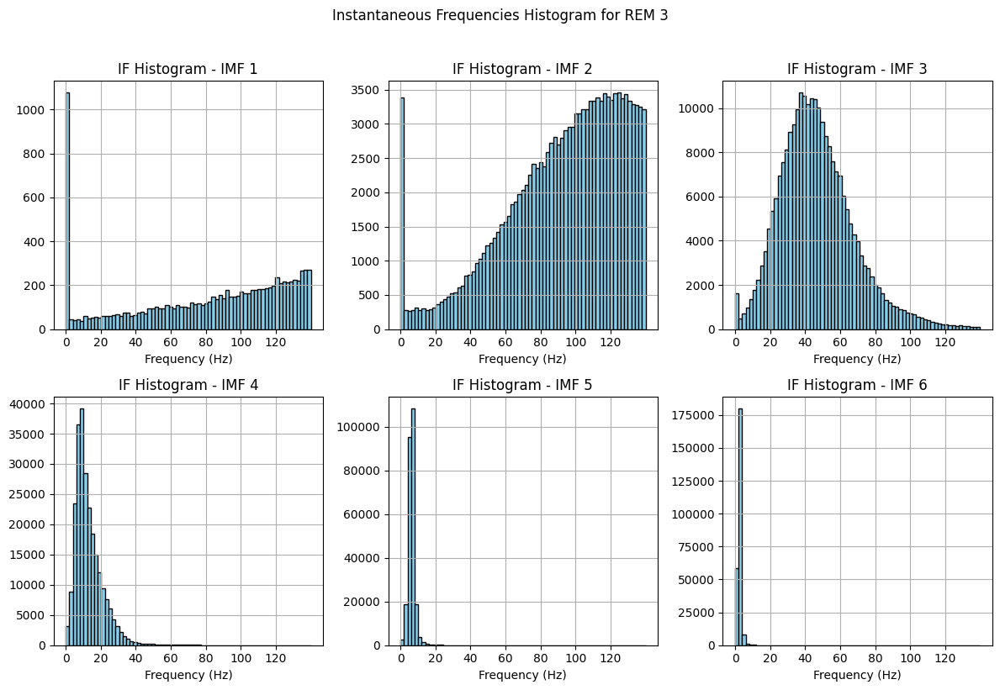

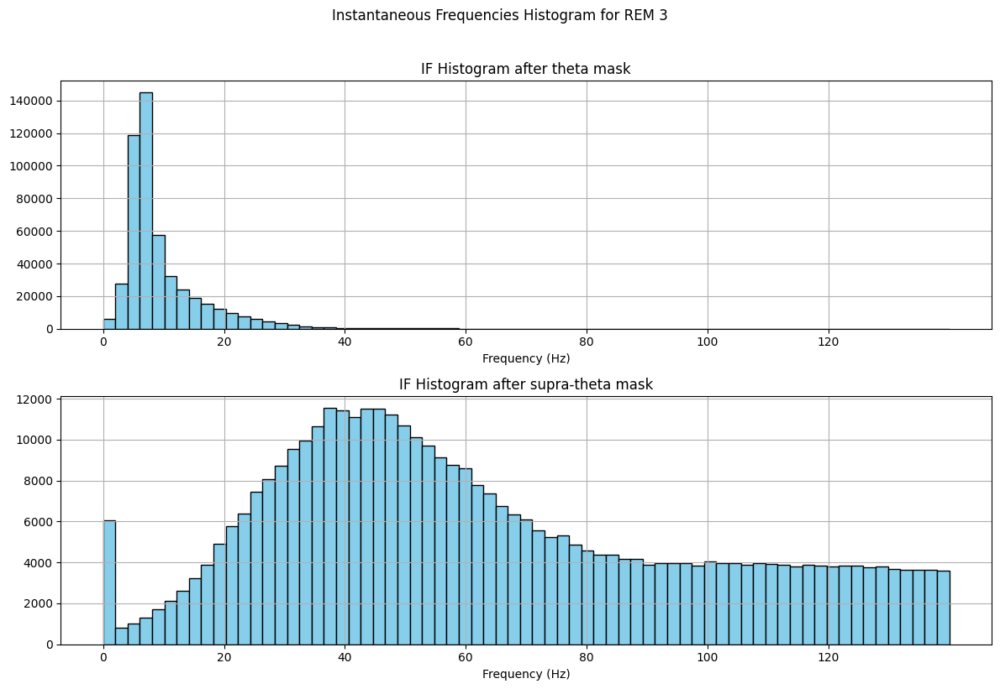

6
252500
[False False False  True  True False]
theta shape: (252500,)


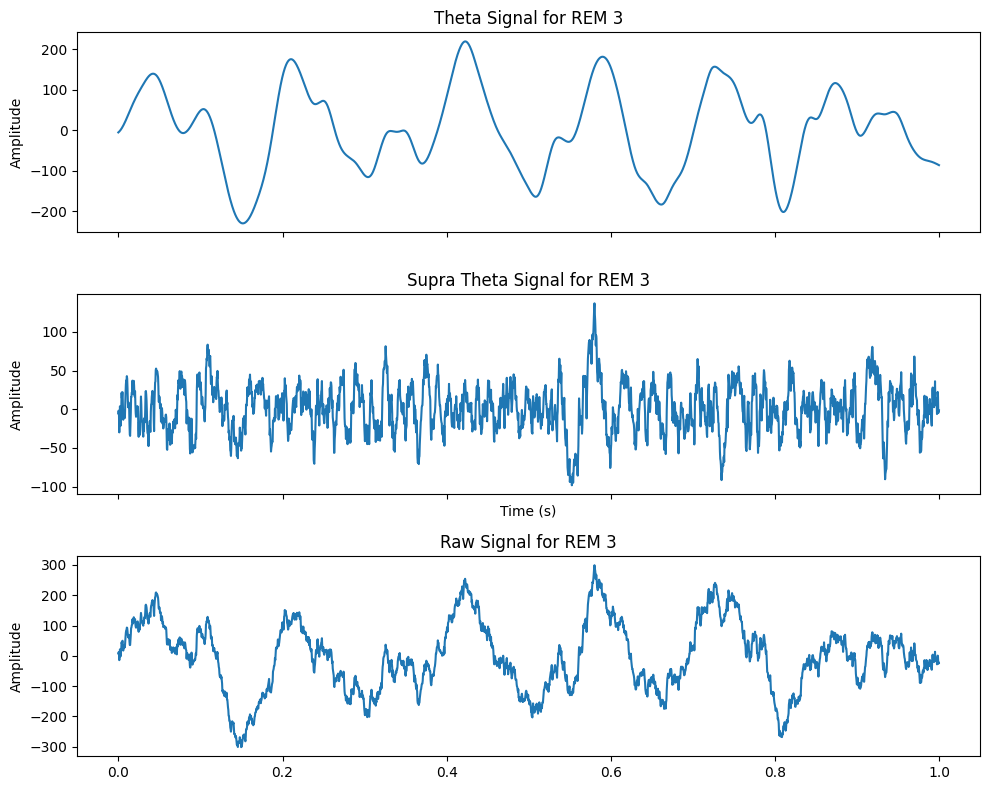

(127500, 6)


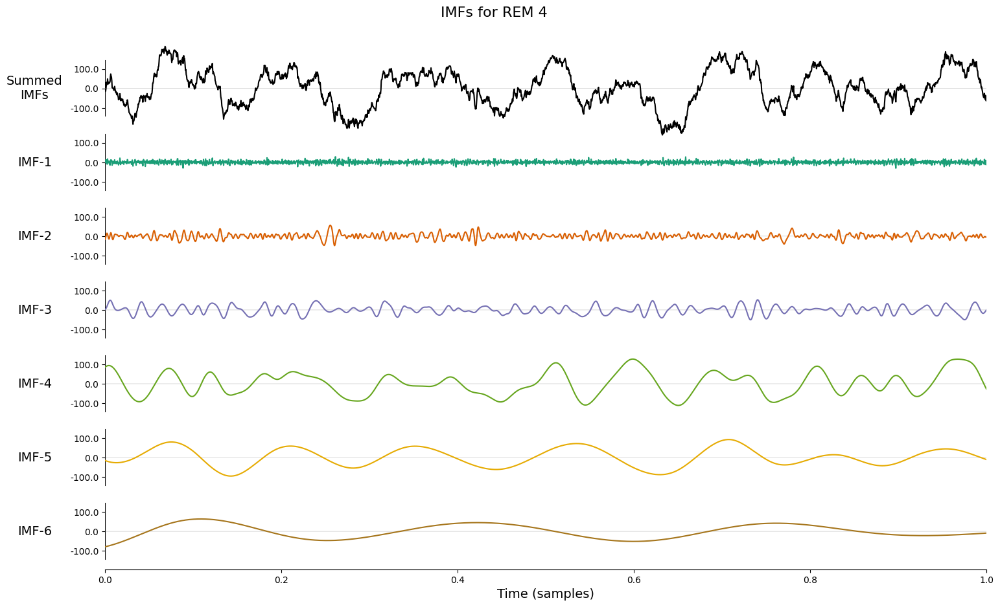

IF shape: (127500, 6)


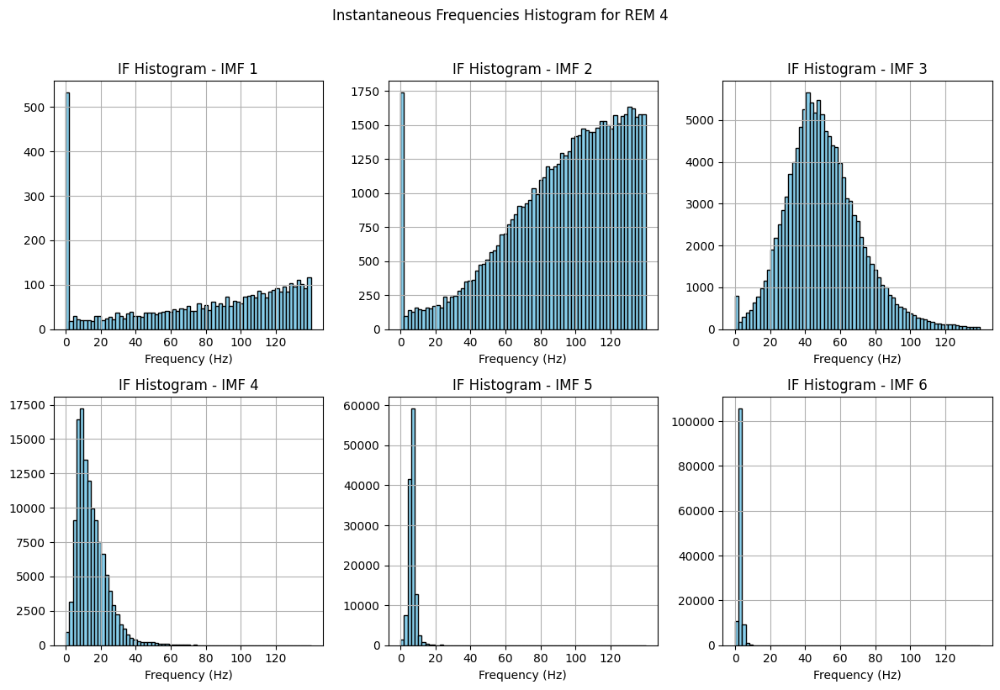

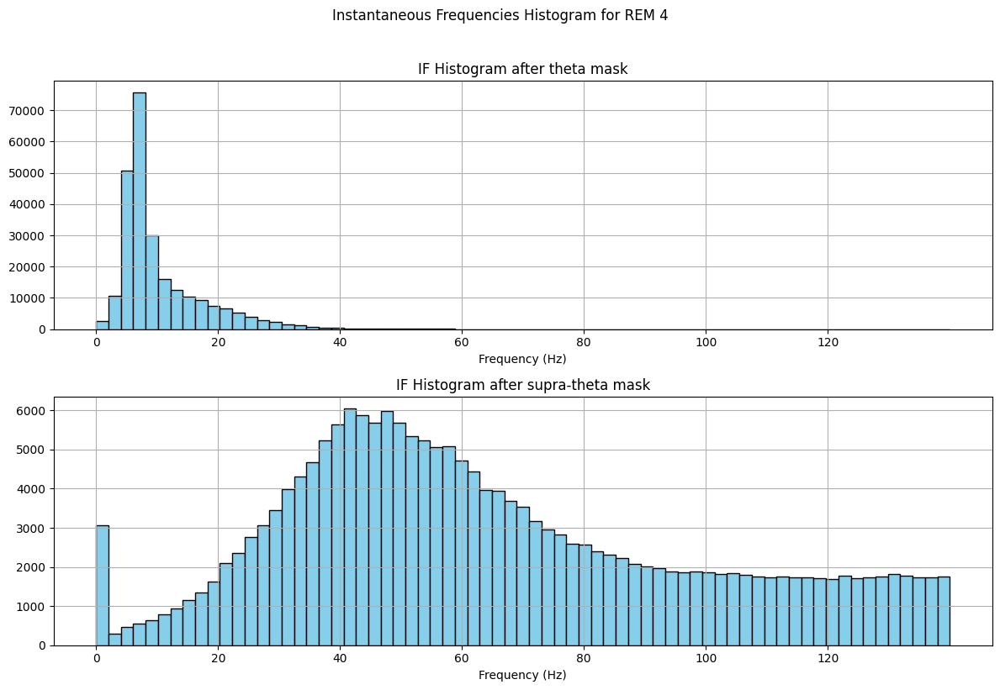

6
127500
[False False False  True  True False]
theta shape: (127500,)


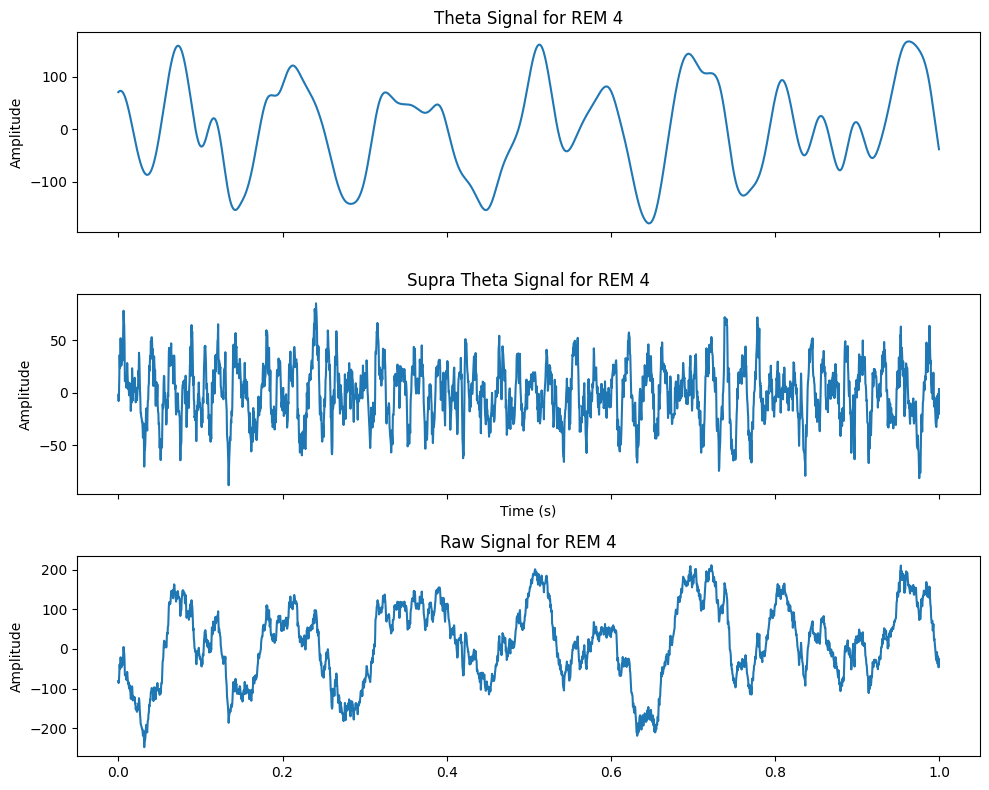

(267500, 6)


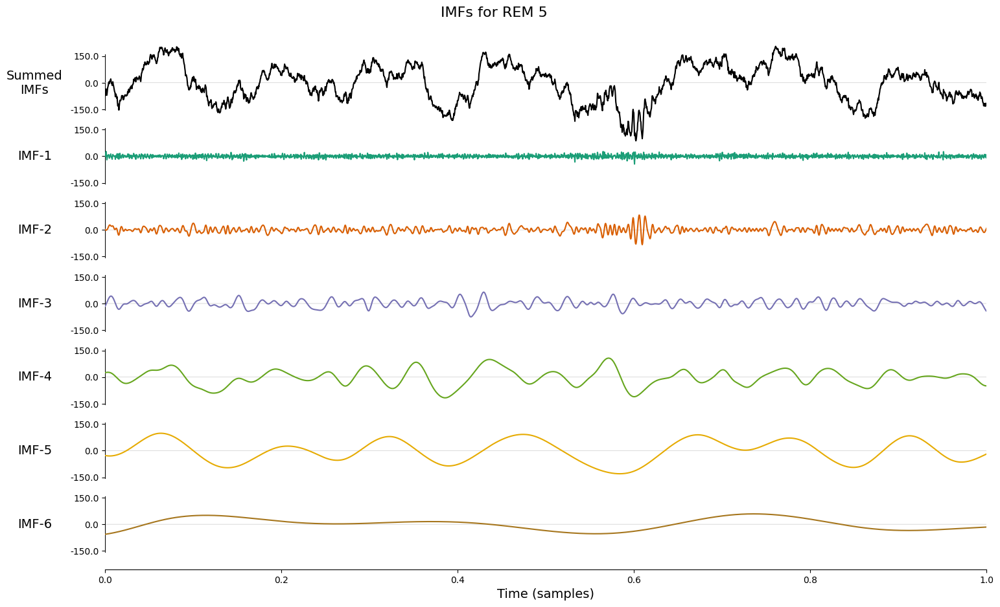

IF shape: (267500, 6)


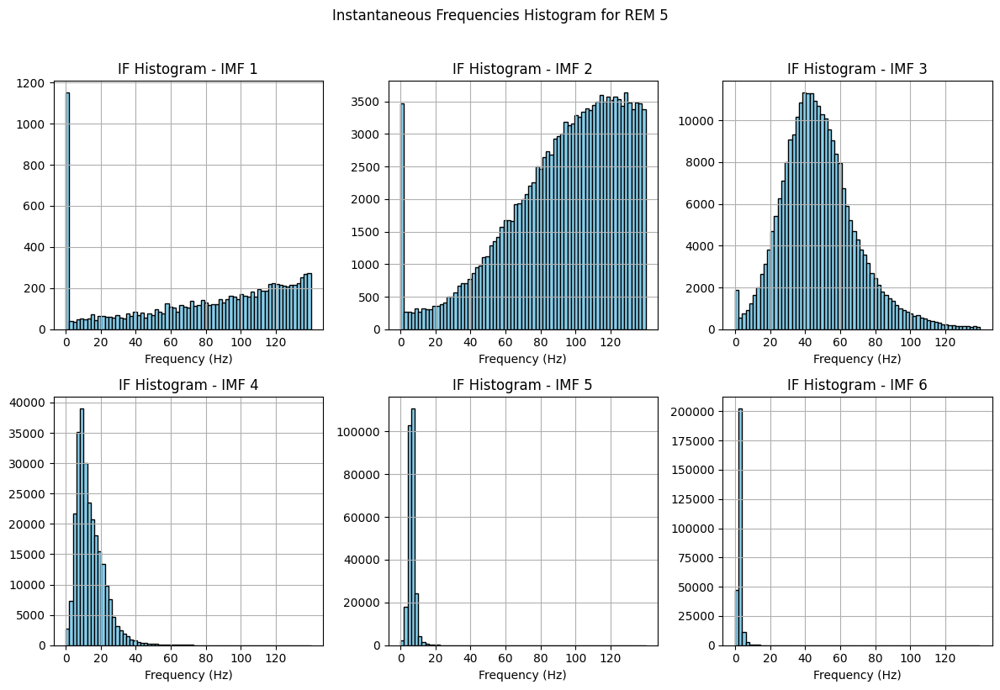

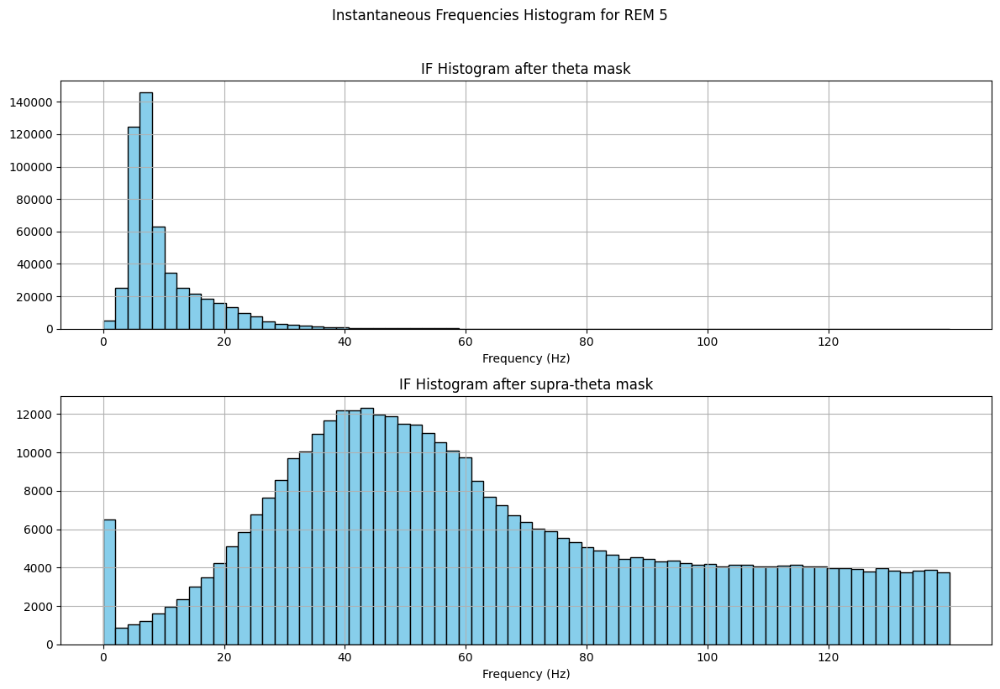

6
267500
[False False False  True  True False]
theta shape: (267500,)


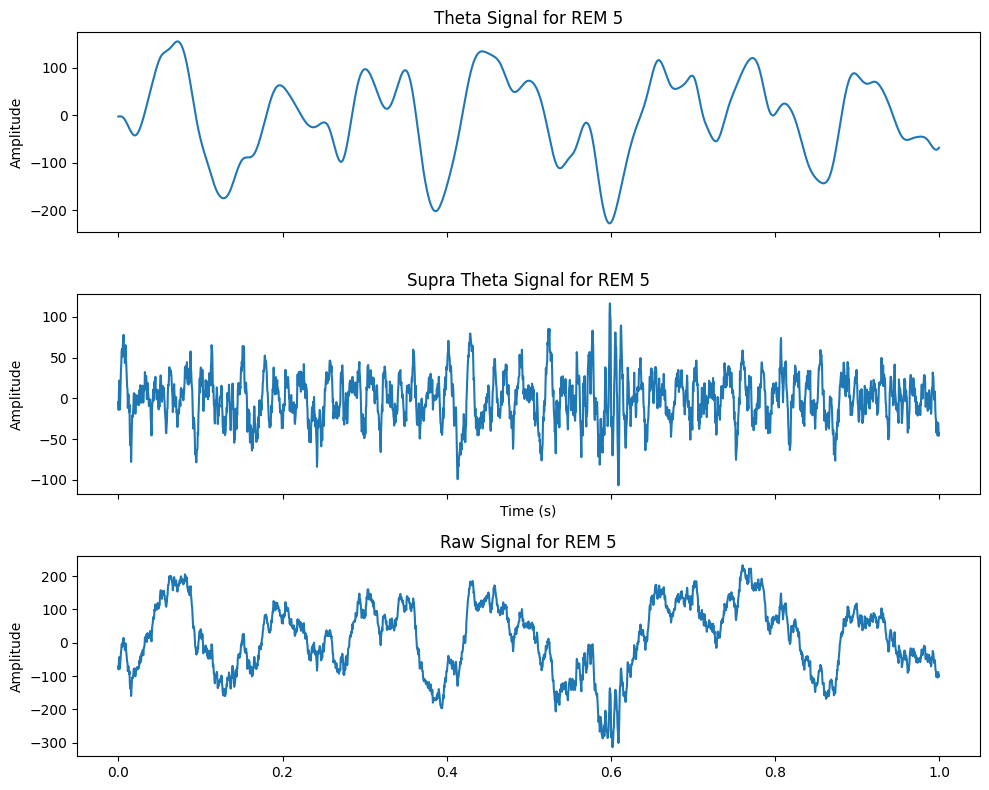

(125000, 6)


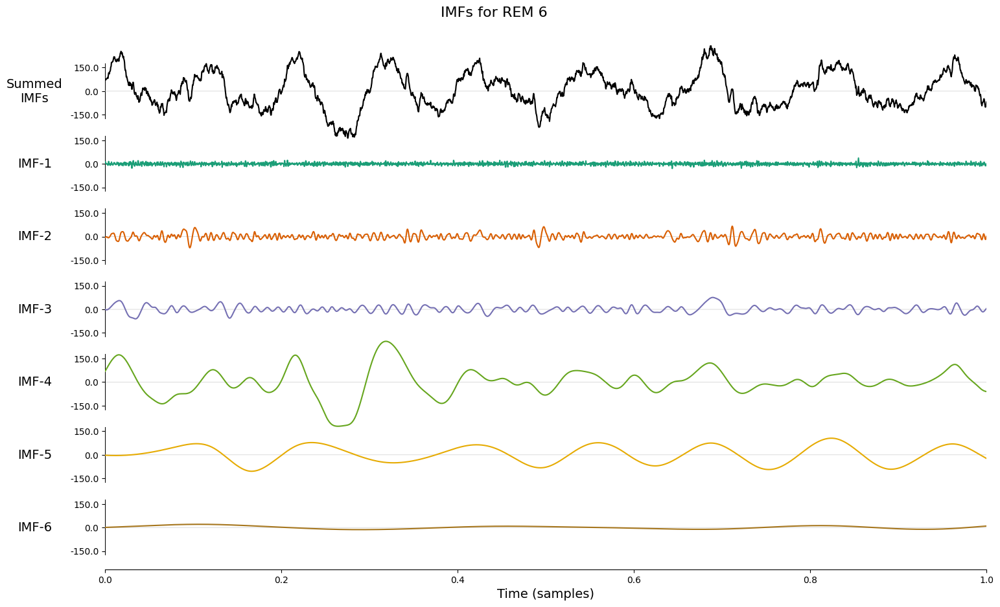

IF shape: (125000, 6)


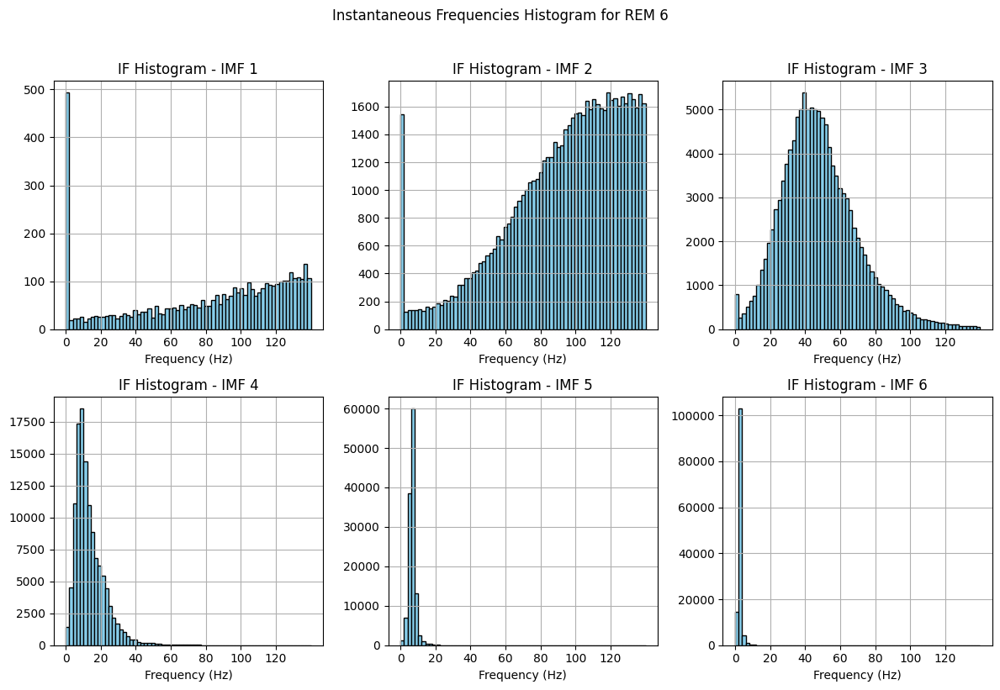

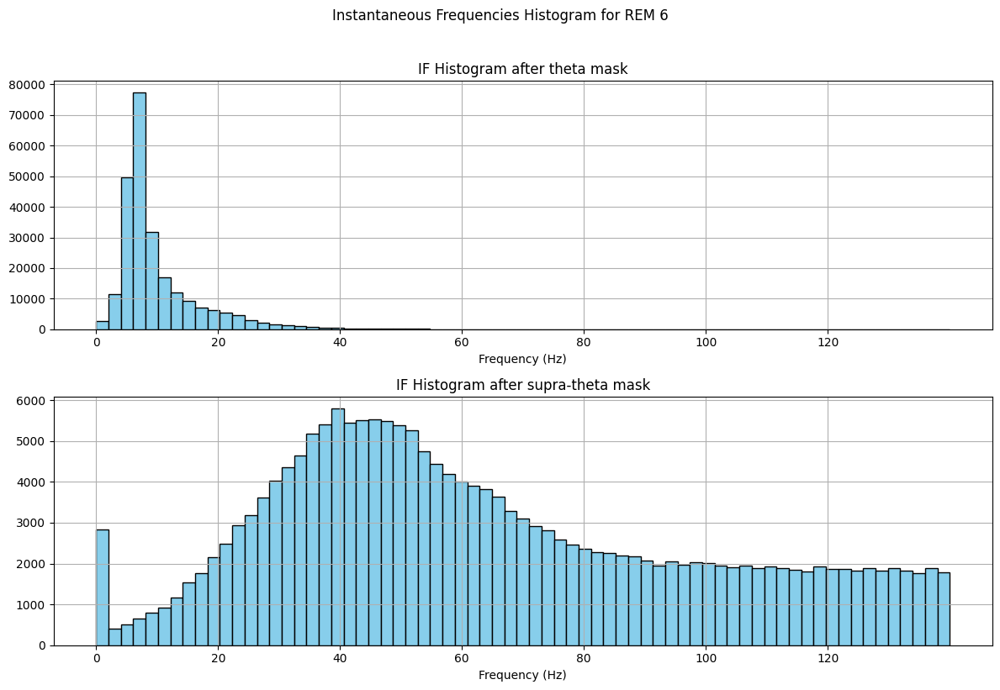

6
125000
[False False False  True  True False]
theta shape: (125000,)


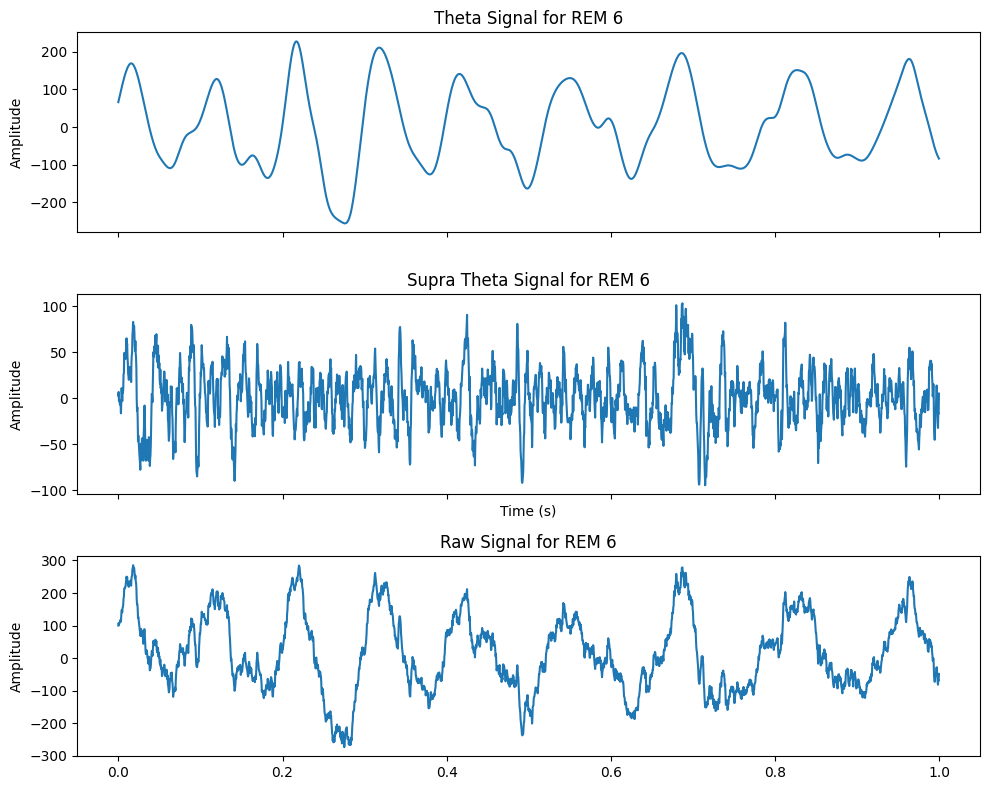

(62500, 6)


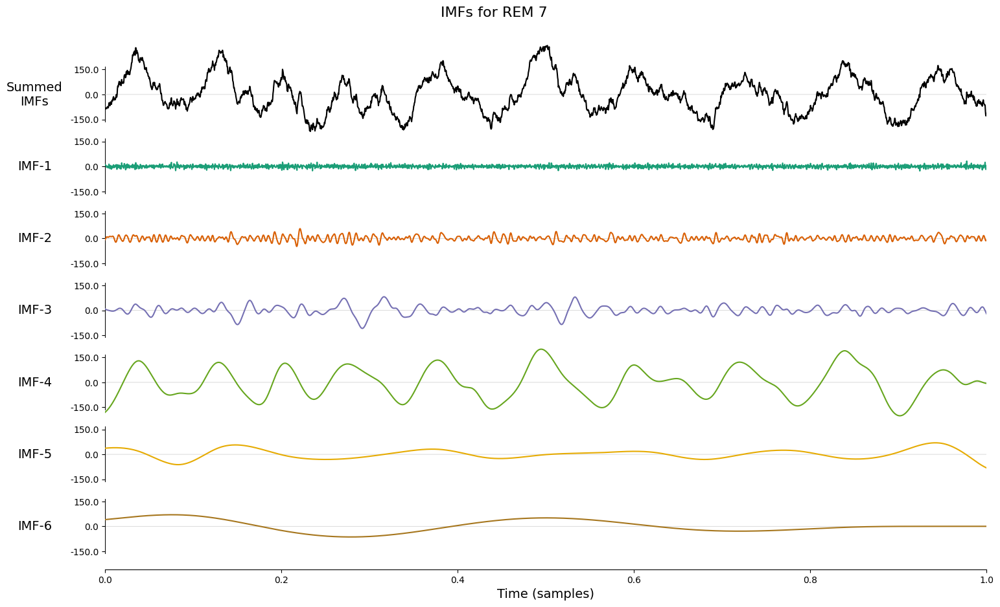

IF shape: (62500, 6)


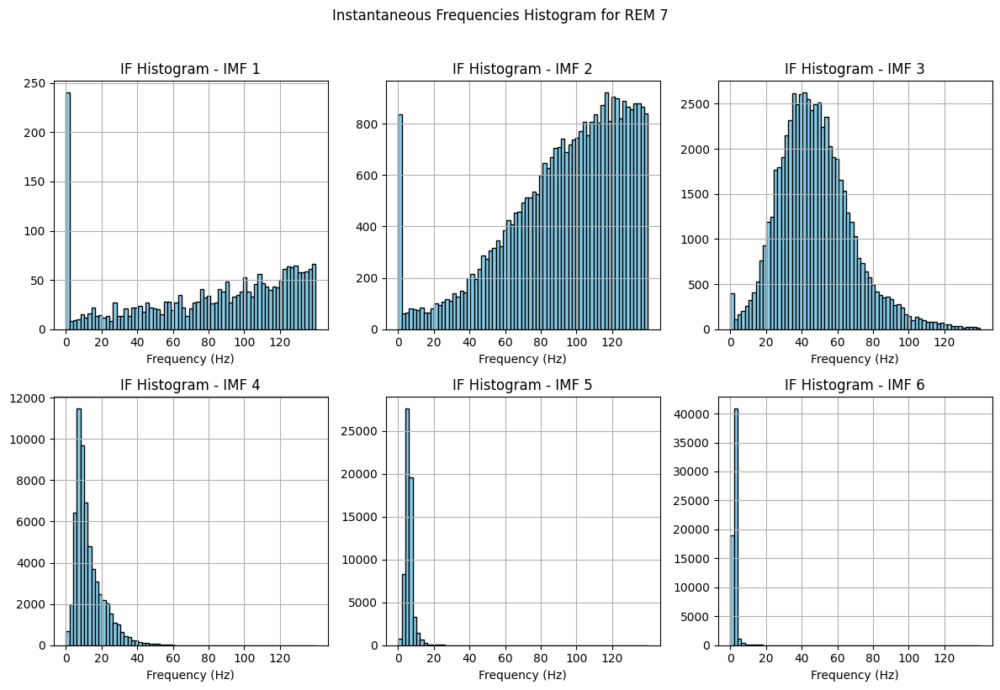

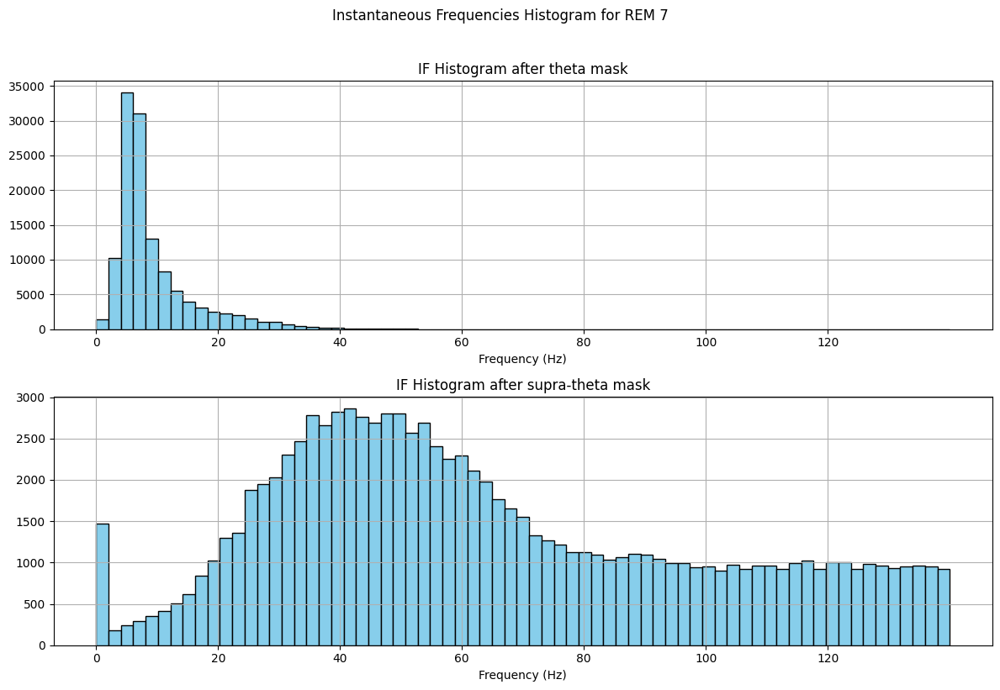

6
62500
[False False False  True  True False]
theta shape: (62500,)


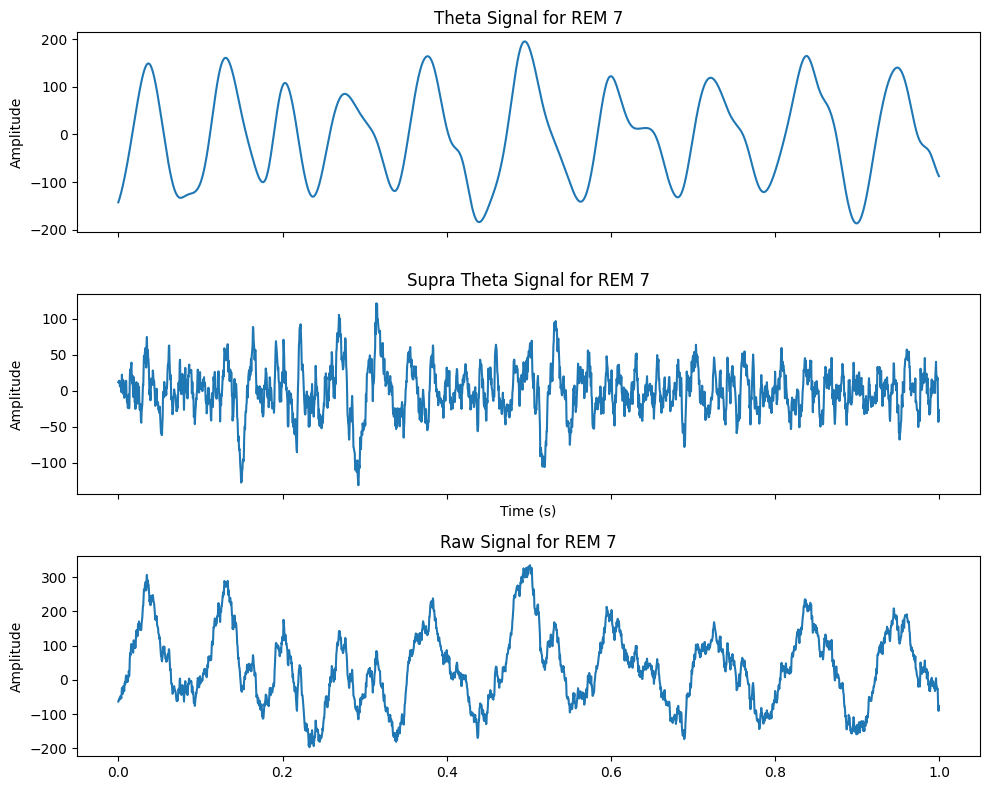

(25000, 6)


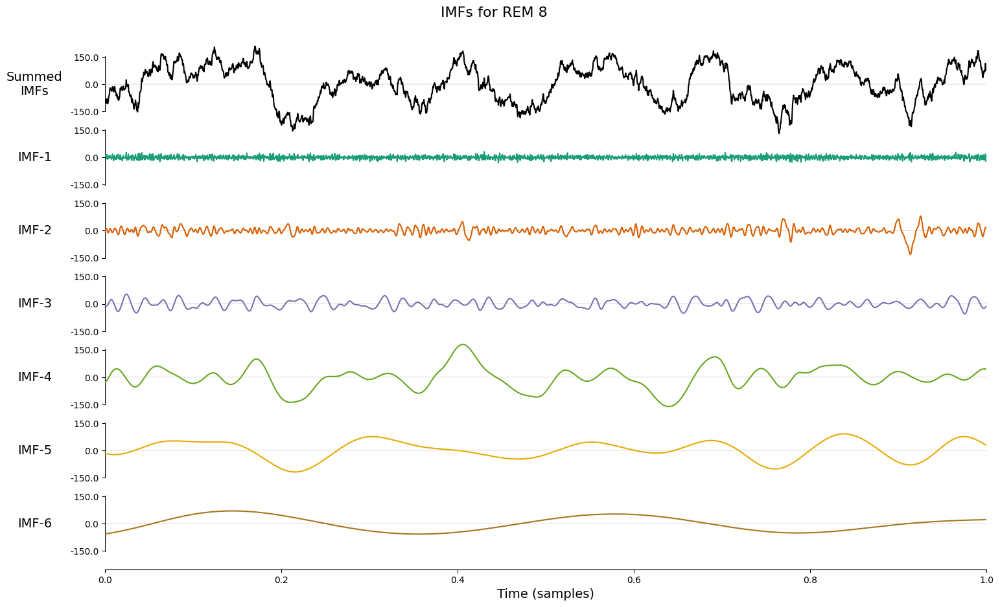

IF shape: (25000, 6)


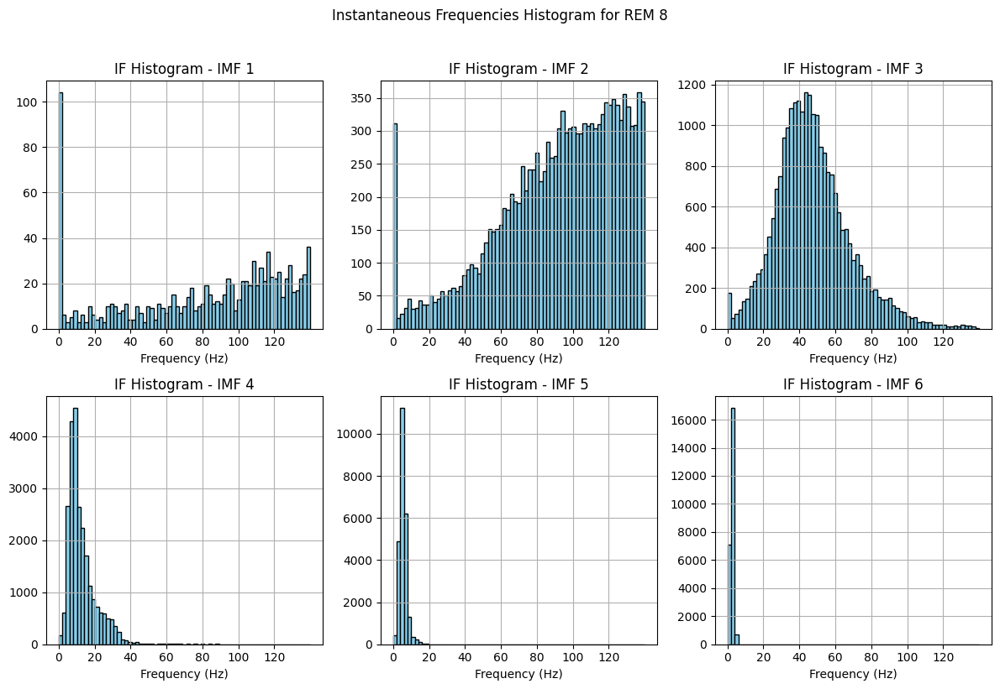

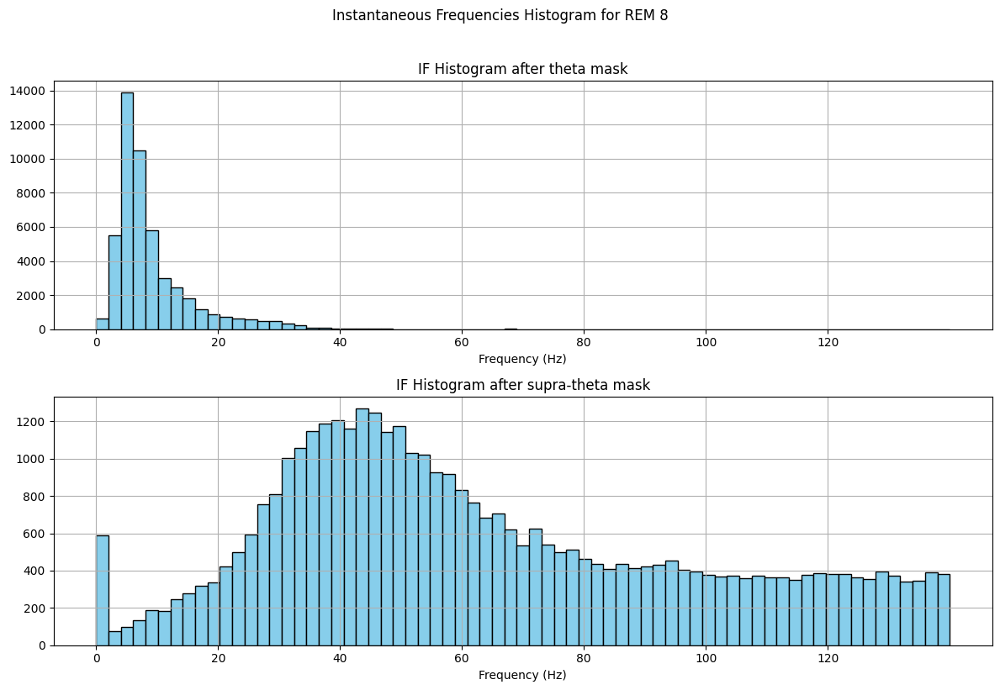

6
25000
[False False False  True  True False]
theta shape: (25000,)


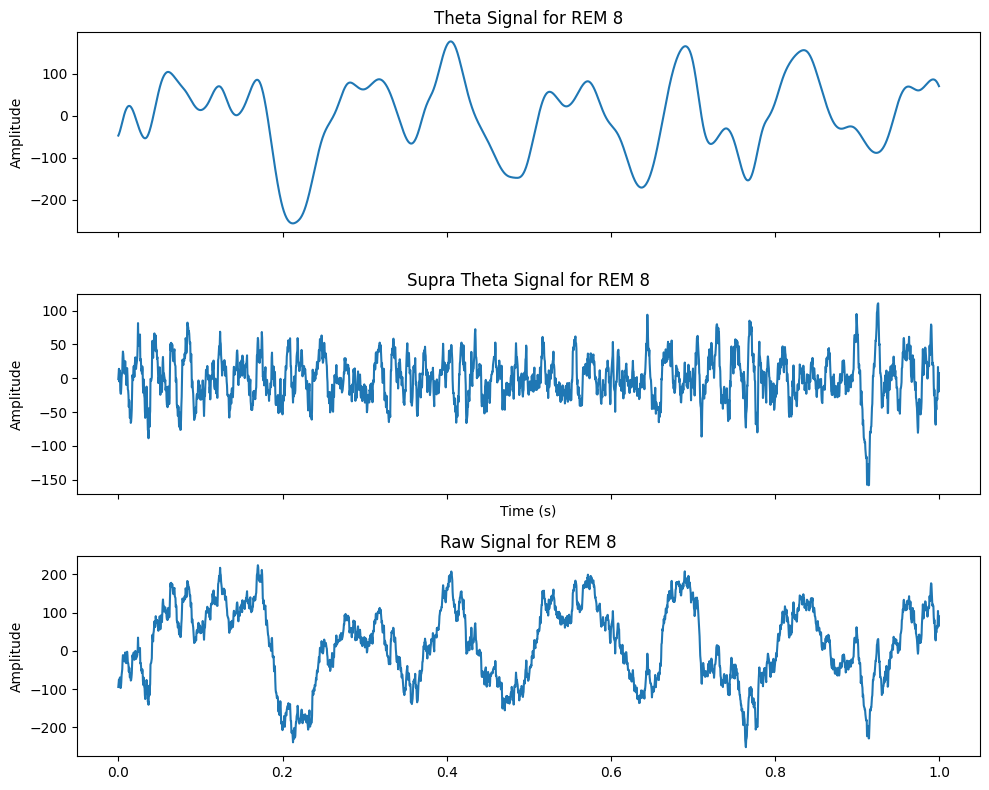

(357500, 6)


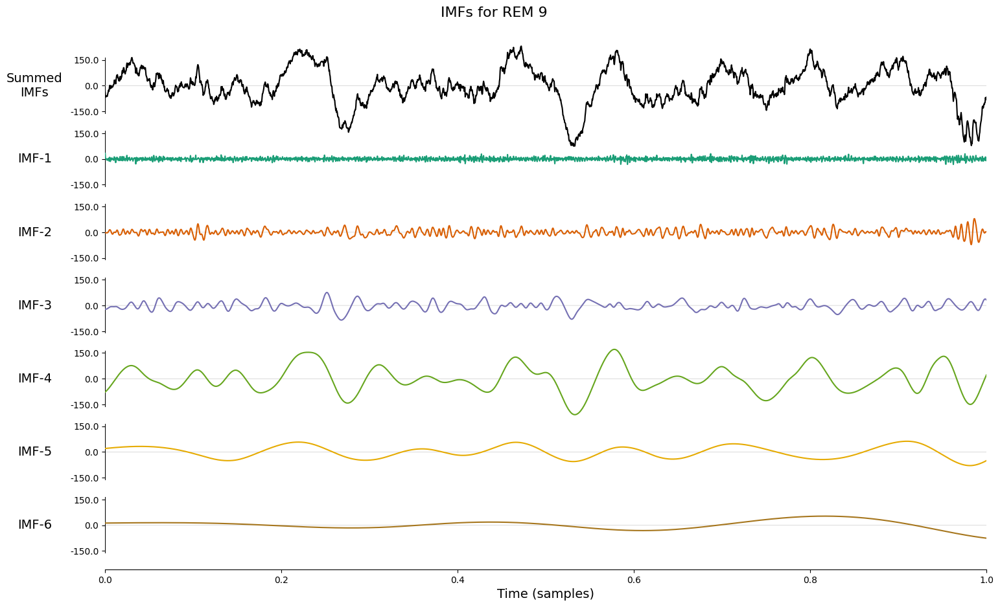

IF shape: (357500, 6)


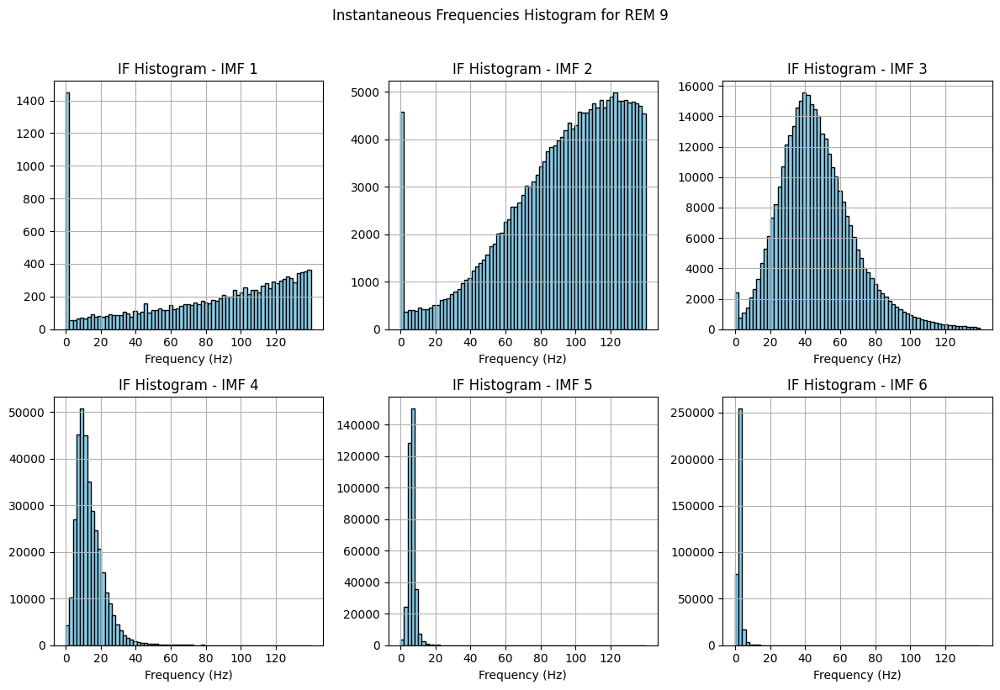

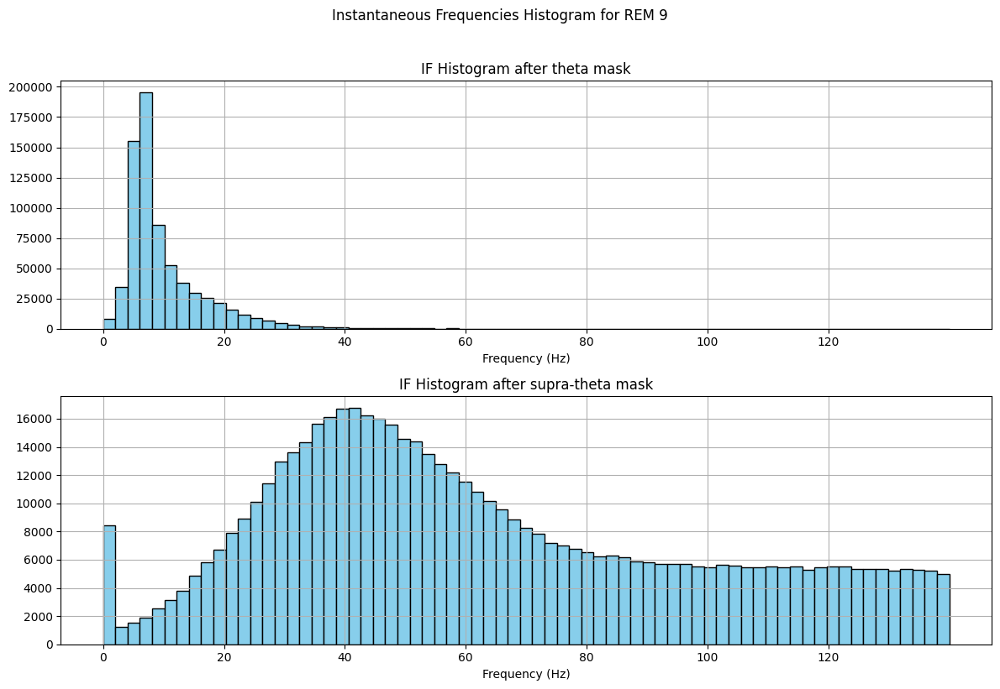

6
357500
[False False False  True  True False]
theta shape: (357500,)


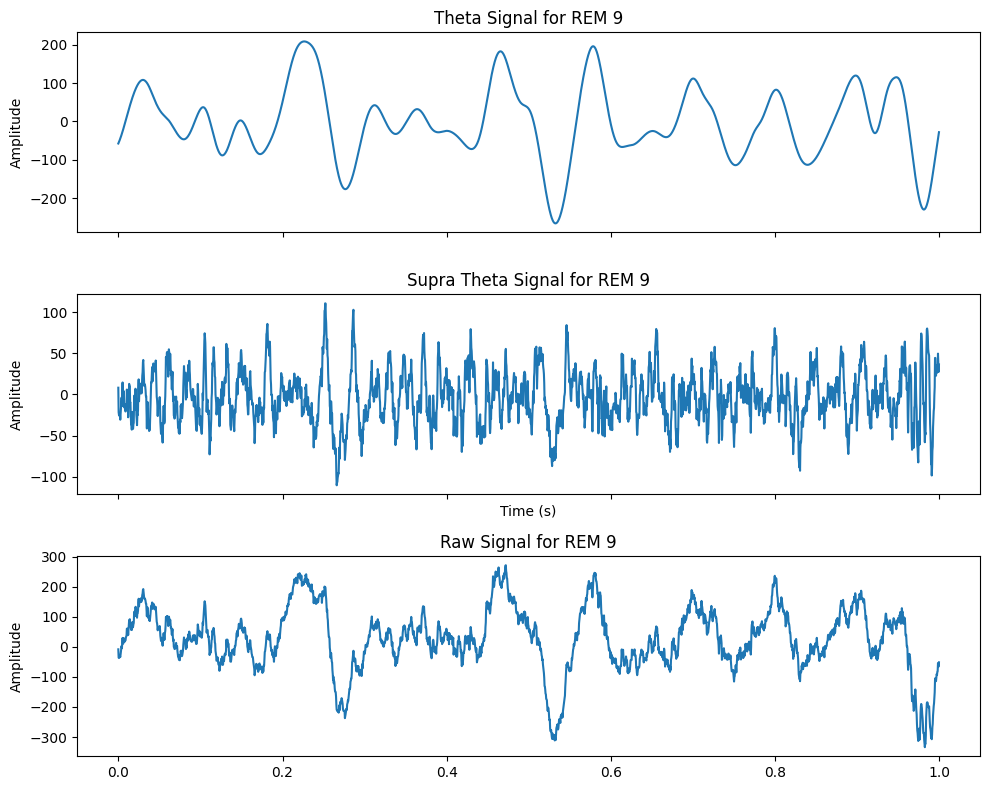

In [36]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
fs=2500
raw_signal_path = r'E:\Donders\1\raw\CN\post_trial5_2017-09-28_14-55-18\HPC_100_CH46.continuous.mat'
# Open the HDF file
file_path = r'E:\Donders\1\processed\CN\post_trial5_2017-09-28_14-55-18\post_trial5_2017-09-28_14-55-18_REM_dict.h5'
with h5py.File(file_path, 'r') as hdf_file:
    # Access the main key (e.g., 'post_trial5_2017-09-28_14-55-18')
    main_key = 'post_trial5_2017-09-28_14-55-18'

    # Access the REM dictionary under the main key
    rem_dict = hdf_file[main_key]

    # Loop through each REM epoch
    for rem_epoch_key in rem_dict.keys():
        # Get the dictionary corresponding to the current REM epoch
        rem_epoch_dict = rem_dict[rem_epoch_key]

        # Access the 'IMFs' key to get the Intrinsic Mode Functions
        imfs = rem_epoch_dict['IMFs'] 
        print(imfs.shape)
        # Convert to NumPy array
        imfs_array = np.array(imfs)

        # Plot the Intrinsic Mode Functions for the first second with specified sample rate
        emd.plotting.plot_imfs(imfs_array[:fs, :], sample_rate=fs)

        # Get the current figure and set the title
        plt.gcf().suptitle(f'IMFs for {rem_epoch_key}', fontsize=16)
        # Identify the indices of theta frequencies in the 'IMFs' array
        theta_range = (5, 12)
        sub_theta, theta, supra_theta = tg_split(rem_epoch_dict['IMF_Frequencies'], theta_range)
        plt.show()
        # Access the 'IMFs' key to get the Intrinsic Mode Functions
        IF = rem_epoch_dict['Instantaneous Frequencies'] 
        print("IF shape:", IF.shape)

        # Apply boolean masks to select relevant IF
        theta_IF = IF[:, theta]
        supra_theta_IF = IF[:, supra_theta]

        # Time axis for IF (assuming it's aligned with the raw signal)
        time_axis_IF = np.arange(0, len(IF)) / fs
        
            # Plot histograms for each IF trace corresponding to each IMF (up to 140 Hz)
        plt.figure(figsize=(12, 8))
        for i in range(IF.shape[1]):
            plt.subplot(2, 3, i+1)
            plt.hist(IF[:, i], bins=np.linspace(0, 140, 70), color='skyblue', edgecolor='black')
            plt.grid(True)
            plt.title(f'IF Histogram - IMF {i+1}')
            plt.xticks(np.arange(0, 140, 20))
            plt.xlabel('Frequency (Hz)')

        plt.suptitle(f'Instantaneous Frequencies Histogram for {rem_epoch_key}', y=1.02)
        plt.tight_layout()
        plt.show()

        # Plot histograms for theta IF and supra_theta IF (up to 140 Hz)
        plt.figure(figsize=(12, 8))

        # Plot histogram for theta IF
        plt.subplot(2, 1, 1)
        plt.hist(theta_IF.flatten(), bins=np.linspace(0, 140, 70), color='skyblue', edgecolor='black')
        plt.grid(True)
        plt.title('IF Histogram after theta mask')
        plt.xticks(np.arange(0, 140, 20))
        plt.xlabel('Frequency (Hz)')

        # Plot histogram for supra_theta IF
        plt.subplot(2, 1, 2)
        plt.hist(supra_theta_IF.flatten(), bins=np.linspace(0, 140, 70), color='skyblue', edgecolor='black')
        plt.grid(True)
        plt.title('IF Histogram after supra-theta mask')
        plt.xticks(np.arange(0, 140, 20))
        plt.xlabel('Frequency (Hz)')

        plt.suptitle(f'Instantaneous Frequencies Histogram for {rem_epoch_key}', y=1.02)
        plt.tight_layout()
        plt.show()
       
   
        print(len(theta))
        print(len(imfs))
        print(theta)
        # Time axis using linspace for IMFs
        time_axis_imfs = np.linspace(0, len(imfs)/2500, len(imfs))
        #for i in range(imfs.shape[1]):
            #plt.figure()
            #plt.plot(time_axis_imfs[:2500], imfs[:, i][:2500])
            #plt.title(f'IMF {i+1} for {rem_epoch_key}')
            #plt.xlabel('Time[s]')
            #plt.ylabel('Amplitude')
            #plt.show()
        # Extract IMFs corresponding to theta signals and sum them up
        theta_imfs_sum = np.sum(imfs[:, theta], axis=1)
        supra_theta_imfs_sum = np.sum(imfs[:, supra_theta], axis=1)
        print("theta shape:", theta_imfs_sum.shape)
       
        start_index, end_index = rem_epoch_dict['start-end'][()]

        
        # Load the raw signal data from the .mat file
        raw_signal_data = loadmat(raw_signal_path)

        # Extract the raw signal array from the loaded data
        raw_signal = raw_signal_data['HPC'][start_index:end_index]

        # Time axis for raw signal
        time_axis_raw = np.linspace(0, len(raw_signal)/2500, len(raw_signal))
        # Time axis for theta signal
        time_axis_theta = np.linspace(0, len(theta_imfs_sum)/2500, len(theta_imfs_sum))
        # Time axis for supra_theta
       # Time axis for supra_theta
        time_axis_supra_theta = np.linspace(0, len(supra_theta_imfs_sum)/fs, len(supra_theta_imfs_sum))

        # Plot all signals in subplots
        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize=(10, 8))

        # Plot theta signal
        ax1.plot(time_axis_theta[:2500], theta_imfs_sum[:2500].T)
        ax1.set_title(f'Theta Signal for {rem_epoch_key}')
        ax1.set_ylabel('Amplitude')

        # Plot raw signal
        ax3.plot(time_axis_raw[:2500], raw_signal[:2500])
        ax3.set_title(f'Raw Signal for {rem_epoch_key}')
        ax3.set_ylabel('Amplitude')

        # Plot supra_theta
        ax2.plot(time_axis_supra_theta[:2500], supra_theta_imfs_sum[:2500].T)
        ax2.set_title(f'Supra Theta Signal for {rem_epoch_key}')
        ax2.set_xlabel('Time (s)')
        ax2.set_ylabel('Amplitude')

        plt.tight_layout()
        plt.show()




